# Imports e  Constantes



In [38]:
# !pip install numpy, seaborn, pygame
# !pip install tensorflow, collections
# !pip install numpy




In [2]:
import pygame
import random
#import requests
#import cv2
import numpy as np
#from google.colab.patches import cv2_imshow
#from google.colab import output
import time
import pickle
import os, sys
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
import pandas as pd

pygame 2.5.2 (SDL 2.28.3, Python 3.10.11)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [3]:
# AI Dependencies
import tensorflow as tf
from tensorflow.keras import layers
from collections import deque

In [4]:
# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

In [5]:
# set SDL to use the dummy NULL video driver,
#   so it doesn't need a windowing system.
os.environ["SDL_VIDEODRIVER"] = "dummy"

In [6]:
# Constants for the game grid
GRID_SIZE = 40
GRID_WIDTH = 10
GRID_HEIGHT = 10

# Define actions
ACTIONS = [(0, -1), (0, 1), (-1, 0), (1, 0)]  # Up, Down, Left, Right

# Colors
WHITE = (255, 255, 255)
GREEN = (0, 255, 0)
RED = (255, 0, 0)
BLUE = (0, 0, 255)  # Color for the snake's head


# Informações Principais



O grupo optou por criar um modelo RL para jogar o jogo Snake, que é representado por um quadrado azul em uma *grid*, que procura comer uma fruta, que é representado por um quadrado vermelho, como mostrado abaixo:

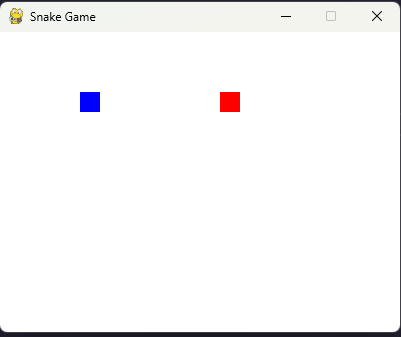

O objetivo é treinar um agente para capturar a fruta com menor quantidade de passos, sendo que para rodar de maneira ótima basta que alcancemos a menor quantidade de passos. Devio a complexidade de rodar muitos estados e a limitação computacional no google colab, o jogo é ganho quando a cobra acha a fruta na 1º vez (ou seja, a nossa cobra não "cresce") e o tamanho do *grid* foi simplificado.

No ambiente construído, como o tamanho do tabuleiro é escalavel e a fruta aparece em lugares aleatórios, o agente aprende a se comportar em ambientes diferentes e sempre otimizar a política afim de chegar no onjetivo o mais rápido possível (menor quantidade de passos). Essa aplicação pode ser ampliada para a exploração de um robô, por exemplo.

*   MDP
  *   O MDP é organizado da seguinte maneira:
      * Ambiente: Grid 10x10 com coordenadas 0-10
      * Estados: Os estados são as distancias (x,y) entre a cabeça da cobra até a fruta
      * Açôes: 4 Acões possívels: Para cima, baixo, esqueda, direita
      * Agente: Cobra que ocupa um quadrado do grid

*   Discretização adotada
    * O ambiente escolhido já é discretizado, por serem coordenadas polares, sendo assim tanto as funções que calculam a distância e que calculam a "melhor" ação já são feitas em um espaço discreto e não continuo.

*   Ambiente Construido
    *   Para o ambiente foi usado a bibliotecad do pygame para lidar com a renderização e os *steps* que são os passos dados a cada ação. Por facilidade de implemtanção existem 2 *steps* na classe *SnakeGame*, de modo a facilitar a implementação, sendo uma para o Monte Carlos e outra para o metódos temporais (TD).

## O problema

* A natureza do nosso ambiente é episódico e deterministico. Mas foi implementado uma simulação de ambiente estocástico para avaliar a performance dos agentes de acordo com o nível de aleatoriedade inserida. Para criar esse ambiente estocástico, adicionamos uma probabilidade da ação escolhida pelo agente não se concretizar em um quadrante específico do *grid*. É nesse quadrante em que pode ocorrer esses eventos aleatórios e ao entrar nessa zona, uma das ações ocorre com a mesma probabilidade (25%).

* Quais são os seus estados terminais (quando existem): Quando a cobra bate em um limite do grid ou quando come a fruta.

* Como sua função de recompensa é definida: A principal *reward shape* é -1 para cada passo que não é o de alcaçar a fruta e ou colide com a parede, 99 caso coma a fruta. Porém também fizemos testes com outra três combinações:
1. -10 a cada passo/colisão e 99 ao alcançar a fruta;
2. 0 a cada passo/colisão e 99 ao alcançar a fruta.

* Os paramêtros padrão são definidos na classe RL_Agent da seguinte forma:

  ```def __init__(self, game, alpha=0.1, gamma=0.9, epsilon=1.0, decay=0.995, lambda_s=0.9, stochastic=0, stochastic_percentage=0.1)```

Ao longo das células comentadas, utilizamos elas diversas vezes para realizar todos os testes dos resultados que serão apresentados ao longo do *notebook* (como alteração de parâmetros, reward, estocasticidade, etc.). Como os códigos seriam repetitivos e com poucas mudanças, deixamos apenas um exemplo de como os testes foram feitos comentado, para conhecimento. E também deixamos disponível uma função simples para realizar um treinamento rápido do agente (poucos episódios) para que possa ser validado o funcionamento das classes implementadas. 

# Ambiente e Agente: MC, Sarsa, QLearning

In [7]:
class SnakeGame():
  def __init__(self, delay_time = 0.000005, reward_shape=(0,99)):
      pygame.init()
      self.screen = pygame.display.set_mode((GRID_WIDTH * GRID_SIZE, GRID_HEIGHT * GRID_SIZE))
      pygame.display.set_caption("Snake Game - RL - Talasso, Ferreira, Gibosky")
      self.delay_time = delay_time
      self.reset()
      self.reward_shape = reward_shape

  def get_state(self):
    s = self.snake[0]
    f = self.food

    state_x = s[0] - f[0]
    state_y = s[1] - f[1]

    return (state_x, state_y)

  def reset(self):
      self.food = self.initialize_food()
      self.snake = self.initialize_snake(food = self.food)

  def reset_dqn(self):
      self.food = self.initialize_food()
      self.snake = self.initialize_snake(food = self.food)
      return self.snake

  def initialize_food(self):
      empty_cells = [(x, y) for x in range(GRID_WIDTH) for y in range(GRID_HEIGHT)]
      return random.choice(empty_cells)

  def initialize_snake(self, food):
      empty_cells = [(x, y) for x in range(GRID_WIDTH) for y in range(GRID_HEIGHT)]
      empty_cells.remove(food)
      return [random.choice(empty_cells)]

  def is_valid_move(self, action):

      new_head = (self.snake[0][0] + action[0], self.snake[0][1] + action[1])
      #print("new_head[0]", new_head[0] < 0)
      #print("new_head[0]", new_head[0] >= GRID_WIDTH)
      #print("new_head[1]", new_head[1] < 0)
      #print("new_head[1]", new_head[1] >= GRID_HEIGHT)
      #print("new_head in ", new_head in self.snake) # erro esta aqui
      if (
          new_head[0] < 0
          or new_head[0] >= GRID_WIDTH
          or new_head[1] < 0
          or new_head[1] >= GRID_HEIGHT
          or new_head in self.snake
      ):
          return False

      return True

  def step(self, reward_shape, method = 'random', value_function = None, N0 = 1, N = 1,
            test_only = False, stochastic = False, stochastic_level = 0.9, weights = None):

    reward = 0
    get = False
    # valid_actions = [action for action in ACTIONS if self.is_valid_move(action)]
    # action = random.choice(ACTIONS)
    action = self.get_desired_action(method = method, value_function = value_function, N0 = N0, N = N, test_only = test_only, weights = weights)
    is_valid = self.is_valid_move(action)
    while not is_valid:
        #print("Nao e valido")
        action = self.get_desired_action(method = 'random', value_function = value_function, N0 = N0, N = N, test_only = test_only, weights = weights)
        reward = reward_shape[0]
        is_valid = self.is_valid_move(action)
        #return reward, True  # No reward and episode ends
    #print("Action Selected", action)
    if self.snake[0] == self.food:
        self.food = self.initialize_food()
        self.snake.append((0, 0))
        reward = reward_shape[1]
        get = True
    else:
        reward = reward_shape[0]
    #elif action != self.get_desired_action():
    #    reward = reward_shape[0]

    if stochastic == 'all': #se todo tabuleiro é estocastico
      if np.random.uniform(0,1,1)[0] < stochastic_level: #o com essa probabilidade, uma ação aleatoria é tomada

        action = self.get_desired_action(method = 'random', value_function = value_function, N0 = N0, N = N, test_only = test_only, weights = weights)
        is_valid = self.is_valid_move(action)
        while not is_valid:
            #print("Nao e valido")
            action = self.get_desired_action(method = 'random', value_function = value_function, N0 = N0, N = N, test_only = test_only, weights = weights)
            reward = reward_shape[0]
            is_valid = self.is_valid_move(action)


    if stochastic == 'up': #se a parte de cima do tabuleiro é estocastico

      if self.snake[0][0] <=4:
        if np.random.uniform(0,1,1)[0] < stochastic_level: #o com essa probabilidade, uma ação aleatoria é tomada

          action = self.get_desired_action(method = 'random', value_function = value_function, N0 = N0, N = N, test_only = test_only, weights = weights)
          is_valid = self.is_valid_move(action)
          while not is_valid:
              #print("Nao e valido")
              action = self.get_desired_action(method = 'random', value_function = value_function, N0 = N0, N = N, test_only = test_only, weights = weights)
              reward = reward_shape[0]
              is_valid = self.is_valid_move(action)


    if stochastic == 'type2': #se a parte de cima do tabuleiro é estocastico

      state = self.get_state()

      if state[0] == 0 or state[1] == 0: #se estiver na mesma "reta" que a fruta
        if np.random.uniform(0,1,1)[0] < stochastic_level: #o com essa probabilidade, uma ação aleatoria é tomada

          action = self.get_desired_action(method = 'random', value_function = value_function, N0 = N0, N = N, test_only = test_only, weights = weights)
          is_valid = self.is_valid_move(action)
          while not is_valid:
              #print("Nao e valido")
              action = self.get_desired_action(method = 'random', value_function = value_function, N0 = N0, N = N, test_only = test_only, weights = weights)
              reward = reward_shape[0]
              is_valid = self.is_valid_move(action)

    new_head = (self.snake[0][0] + action[0], self.snake[0][1] + action[1])

    self.snake[0] = new_head
    #self.snake.insert(0, new_head)
    #self.snake.pop()

    return reward, True, get, action
  
  def step_dqn(self, action):
    actual_action = ACTIONS[action]

    new_head = (self.snake[0][0] + actual_action[0], self.snake[0][1] + actual_action[1])

    if (new_head in self.snake or
        new_head[0] < 0 or new_head[0] >= GRID_WIDTH or
        new_head[1] < 0 or new_head[1] >= GRID_HEIGHT):
        return self.reward_shape[0], self.get_state(), True  # Negative reward for losing, True for game over

    # Check if the snake has eaten the food
    if new_head == self.food:
        self.snake.insert(0, new_head)  # Add new head to the snake
        self.food = self.initialize_food()  # Generate new food
        return self.reward_shape[1], self.get_state(), False  # Positive reward for eating food

    # Normal movement (no food eaten)
    self.snake.insert(0, new_head)  # Add new head to the snake
    self.snake.pop()  # Remove the last segment of the snake

    # # Calculate a reward based on proximity to food (can be more complex)
    # distance_to_food = abs(new_head[0] - self.food[0]) + abs(new_head[1] - self.food[1])
    reward = self.reward_shape[0]

    return reward, self.get_state(), False  # Return reward, new state, and False for game not over

  def step_q(self, action):
      new_head = (self.snake[0][0] + action[0], self.snake[0][1] + action[1])

      if (new_head in self.snake) or (new_head[0] < 0 or new_head[0] >= GRID_WIDTH or new_head[1] < 0 or new_head[1] >= GRID_HEIGHT):
          return self.reward_shape[0], self.get_state(), False

      if new_head == self.food:
          self.food = self.initialize_food()
          return self.reward_shape[1], self.get_state(), True

      self.snake[0] = new_head


      distance_to_food = abs(new_head[0] - self.food[0]) + abs(new_head[1] - self.food[1])
      # alternative reward value: reward = -distance_to_food
      reward = self.reward_shape[0]

      return reward, self.get_state(), False  # Return reward, new state, and False for game not over



  def render(self, render = True):

      if not render:
        return None

      self.screen.fill(WHITE)
      for i, segment in enumerate(self.snake):
          if i == 0:
              pygame.draw.rect(self.screen, BLUE, (segment[0] * GRID_SIZE, segment[1] * GRID_SIZE, GRID_SIZE, GRID_SIZE))
          else:
              pygame.draw.rect(self.screen, GREEN, (segment[0] * GRID_SIZE, segment[1] * GRID_SIZE, GRID_SIZE, GRID_SIZE))
      pygame.draw.rect(self.screen, RED, (self.food[0] * GRID_SIZE, self.food[1] * GRID_SIZE, GRID_SIZE, GRID_SIZE))
      pygame.display.update()

      # #to run in Colab:
      # #convert image so it can be displayed in OpenCV
      # view = pygame.surfarray.array3d(self.screen)
      # img_bgr = cv2.cvtColor(view, cv2.COLOR_RGB2BGR)
      # cv2_imshow(img_bgr)
      # time.sleep(self.delay_time)
      # output.clear()

  # Optmization that make snake go only to the direction of the food, instead of choosing a random direction
  def get_desired_action(self, method = 'random', value_function = None, N0 = 1, N = 1, test_only = False, weights = None):
      head = self.snake[0]
      food = self.food
      delta_x = food[0] - head[0]
      delta_y = food[1] - head[1]


      if method == 'best':
        if delta_x > 0:
            return (1, 0)  # Right
        elif delta_x < 0:
            return (-1, 0)  # Left
        elif delta_y > 0:
            return (0, 1)  # Down
        elif delta_y < 0:
            return (0, -1)  # Up
        else:
            return (0, 0)  # No movement


      #choose a random action
      if method  == 'random':
        possible_actions = [(1,0), (-1,0), (0,1),(0,-1)]
        idx = np.random.choice([0,1,2,3])
        return possible_actions[idx]

      if method == 'value':
        #print(N0)
        epsilon = N0/(N0+N)

        if test_only:
          epsilon = 0.01

        if np.random.uniform(0,1,1)[0] < epsilon:
          possible_actions = [(1,0), (-1,0), (0,1),(0,-1)]
          idx = np.random.choice([0,1,2,3])
          return possible_actions[idx]

        state = self.get_state()
        possible_actions = [(1,0), (-1,0), (0,1),(0,-1)]
        max_value = -np.inf
        for a in possible_actions:

          future_state = (state[0] + a[0], state[1] +a[1])
          if self.is_valid_move(a):
            #print(future_state,state,  self.snake, self.food, value_function[str(future_state)])
            if value_function[str(future_state)] >= max_value:
              f = future_state
              v = value_function[str(future_state)]
              max_value = value_function[str(future_state)]
              action = a

      if method == 'linear_aproximator':
        #print(N0)
        epsilon = N0/(N0+N)

        if test_only:
          epsilon = 0.01

        if np.random.uniform(0,1,1)[0] < epsilon:
          possible_actions = [(1,0), (-1,0), (0,1),(0,-1)]
          idx = np.random.choice([0,1,2,3])
          return possible_actions[idx]

        state = self.get_state()
        possible_actions = [(1,0), (-1,0), (0,1),(0,-1)]
        max_value = -np.inf
        for a in possible_actions:

          future_state = (state[0] + a[0], state[1] +a[1])
          if self.is_valid_move(a):
            #print(future_state,state,  self.snake, self.food, value_function[str(future_state)])

            features = [0,0] #getting the features to make the decision
            features[0] = abs(future_state[0])
            features[1] = abs(future_state[1])

            predicted_future_value = weights[0]*features[0] + weights[1]*features[1] + weights[2] #linear function
            if predicted_future_value >= max_value:
              f = future_state
              v = predicted_future_value
              max_value = predicted_future_value
              action = a



        #print('--', v, f, action)
        return action

In [8]:
class RL_Agent(SnakeGame):
    def __init__(self, game, alpha=0.1, gamma=0.9, epsilon=1.0, decay=0.995, lambda_s=0.9, stochastic=0, stochastic_percentage=0.1):
        self.game = game
        self.q_table = {}  # Initialize Q-table, dict of tuples
        self.e_table = {} #table for elegibility trace on sarsa(lambda)
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.decay = decay
        self.lambda_s = lambda_s
        self.decision_explore_exploit = []
        self.step_per_episode = []
        self.value_function = self.create_value_function()

        self.weights = np.zeros(3) #two features one bias
        self.loss = []
        self.stochastic = stochastic # 0 not stochastic, 1 partialy stochastic
        if stochastic == 1:
          self.stochastic_quadrant = self.define_stochastic_quadrant(stochastic_percentage)
          print("Quadrant", self.stochastic_quadrant)

    def define_stochastic_quadrant(self, percentage):
      # Up to percentage of the board is stochastic
      quadrant_width = int(GRID_WIDTH * percentage)
      quadrant_height = int(GRID_HEIGHT * percentage)
      return (0, 0, quadrant_width, quadrant_height)

    def get_q_value(self, state, action):
        return self.q_table.get((state, action), 0)

    def get_e_value(self, state, action):
        return self.e_table.get((state, action), 0)

    def choose_action(self, state, choose_random=False, epsilon = None):

        if epsilon is None:
          epsilon = self.epsilon

        if choose_random: # If agent is stuck on edge
          self.decision_explore_exploit.append(0)
          return random.choice(ACTIONS)

        # Explore or exploit
        if np.random.rand() < epsilon:
            self.decision_explore_exploit.append(0) # Eploring
            return random.choice(ACTIONS)
        else:
            self.decision_explore_exploit.append(1) # Exploiting
            q_values = [self.get_q_value(state, a) for a in ACTIONS]
            max_q = max(q_values)
            actions_with_max_q = [a for a in ACTIONS if self.get_q_value(state, a) == max_q]
            return random.choice(actions_with_max_q)

    def create_value_function(self):
      global GRID_HEIGHT
      global GRID_WIDTH
      value = {}

      for x in range(-GRID_WIDTH+1, GRID_WIDTH):
        for y in range(-GRID_HEIGHT+1, GRID_HEIGHT):

          value[f'({x}, {y})'] = 0

      value[str((0,0))] = np.inf #final state
      return value

    def is_in_stochastic_quadrant(self, x, y):
      x_start, y_start, qw, qh = self.stochastic_quadrant
      return x_start <= x < x_start + qw and y_start <= y < y_start + qh

    def train(self, episodes, sarsa):
      for episode in range(episodes):
        self.game.reset()
        state = self.game.get_state()
        done = False
        counter = 0
        while not done:
          counter += 1
          # Check if is a stochastic env or not and take action
          if self.stochastic == 1 and self.is_in_stochastic_quadrant(self.game.snake[0][0], self.game.snake[0][1]):
            action = actual_action = random.choice(ACTIONS)
          else:
            action = self.choose_action(state)

          # Check if action is valid
          is_valid = self.game.is_valid_move(action)
          while not is_valid:
            action = self.choose_action(state, choose_random = True)
            is_valid = self.game.is_valid_move(action)
          reward, next_state, done = self.game.step_q(action)
          if sarsa == True:
              # after getting the new state, I need to compute ne next action
              next_action = self.choose_action(next_state)
              self.update_q_table(state, action, reward, next_state, next_action)
          else:
            self.update_q_table(state, action, reward, next_state)
          state = next_state
        self.step_per_episode.append(counter)
        self.epsilon *= self.decay

    def train_sarsa_lambda(self, episodes):
        possible_actions = [(1,0), (-1,0), (0,1),(0,-1)]
        for episode in range(episodes):
          self.game.reset()
          state = self.game.get_state()
          done = False
          counter = 0
          while not done:
              counter += 1
              action = self.choose_action(state) # A
              is_valid = self.game.is_valid_move(action)
              while not is_valid:
                action = self.choose_action(state, choose_random = True)
                is_valid = self.game.is_valid_move(action)
              reward, next_state, done = self.game.step_q(action) # R, S'
              next_action = self.choose_action(next_state) # A'
              delta = self.get_delta(state, action, reward, next_state, next_action)
              current_e = self.get_e_table(state, action)
              self.update_only_e_table(state, action, current_e)

             #updating qtable and etable for all states/actions
              for x in range(-GRID_WIDTH+1, GRID_WIDTH):
                for y in range(-GRID_HEIGHT+1, GRID_HEIGHT):
                    state_ = [(x, y)]
                    for actions in possible_actions:
                        reward_, next_state_, done_ = self.game.step_q(actions)
                        self.update_q_table(state_[0], actions, reward_, delta)

              state = next_state
              action = next_action

          self.step_per_episode.append(counter)
          self.epsilon *= self.decay

    def run_episode(self, sarsa, sarsa_lambda = False): #to test a trained agent

      epsilon = 0 #to test the policy, without random effects

      self.game.reset()
      state = self.game.get_state()
      done = False
      ep_len = 0

      while not done:
          ep_len += 1

          if sarsa == True:
            action = self.choose_action(state, epsilon = 0)
          else:
            action = self.choose_action(state)

          reward, next_state, done = self.game.step_q(action)

          if sarsa == True:
                # after getting the new state, I need to compute ne next action
                next_action = self.choose_action(next_state, epsilon = 0)
                self.update_q_table(state, action, reward, next_state, next_action)
                #print('entrei no sarsa')
          else:
            if sarsa_lambda:
              next_action = self.choose_action(next_state, epsilon = 0)
              self.update_q_table(state, action, reward, self.get_delta( state, action, reward, next_state, next_action))
            else:
              self.update_q_table(state, action, reward, next_state)
                #print('entrei no qlearning')
          state = next_state

      return ep_len


    def linear_aproximator(self, state, V_sampled, epochs = 1, lr = 0.00001, n=1):

      #V_sampled = 2*state[0] + 5*state[1] + 10

      features = [0,0]
      features[0] = abs(state[0])
      features[1] = abs(state[1])

      for i in range(epochs):

        V_pred = self.weights[0]*features[0] + self.weights[1]*features[1] +  self.weights[2] #Linear equation: Y = a_1*x_1 + a_2*x_2 + b
        #print(state, V_sampled, V_pred)

        D0 = (features[0] * (V_pred - V_sampled)) #gradient
        self.weights[0] = self.weights[0] - (lr * D0) #update

        D1 = (features[1] * (V_pred - V_sampled)) #gradient
        self.weights[1] = self.weights[1] - (lr * D1) #update

        D2 = (V_pred - V_sampled) #gradient
        self.weights[2] = self.weights[2] - (lr * D2) #update

      loss = 0.5 * (V_pred - V_sampled)**2

      #print(self.weights)
      self.loss.append(loss)

In [9]:
class QLearning(RL_Agent):
  def update_q_table(self, state, action, reward, next_state):
      max_q_next = max([self.get_q_value(next_state, a) for a in ACTIONS])
      current_q = self.get_q_value(state, action)
      new_q = current_q + self.alpha * (reward + self.gamma * max_q_next - current_q)
      self.q_table[(state, action)] = new_q
      self.value_function[str(state)] = new_q

      self.linear_aproximator(state, new_q)

class Sarsa(RL_Agent):

    def update_q_table(self, state, action, reward, next_state, next_action):
        #max_q_next = max([self.get_q_value(next_state, a) for a in ACTIONS])
        current_q = self.get_q_value(state, action)
        if current_q is None:
            # tive uns erros se não inicializasse algum valor para um Q não visto
            self.q_table[(state, action)] = reward
            self.linear_aproximator(state, new_q)
        else:
            new_q = self.get_q_value(next_state, next_action)
            self.q_table[(state, action)] = current_q + self.alpha * (reward + self.gamma * new_q - current_q)
            self.value_function[str(state)] = current_q + self.alpha * (reward + self.gamma * new_q - current_q)
            self.linear_aproximator(state, new_q)

class Sarsa_lambda(RL_Agent):

    def get_delta(self, state, action, reward, next_state, next_action):
        current_q = self.get_q_value(state, action)
        next_q = self.get_q_value(next_state, next_action)
        delta = reward + self.gamma*(next_q - current_q)

        return delta

    def get_e_table(self, state, action):
        current_e = self.get_e_value(state, action)
        return current_e

    def update_only_e_table(self, state, action, current_e):
        if current_e is None:
            current_e = 0
        self.e_table[(state, action)] = current_e + 1


    def update_q_table(self, state, action, reward, delta):
        #max_q_next = max([self.get_q_value(next_state, a) for a in ACTIONS])
        current_q = self.get_q_value(state, action)
        current_e = self.get_e_table(state, action)
        if current_e is None:
            current_e = 0

        if current_q is None:
            # tive uns erros se não inicializasse algum valor para um Q não visto
            self.q_table[(state, action)] = 0

        else:
            # atualizando Q
            #print(current_q, self.alpha, delta, current_e)
            self.q_table[(state, action)] = current_q + self.alpha * delta * current_e
            self.value_function[str(state)] = current_q + self.alpha * delta * current_e
            # atualizando E com a variação temporal
            self.e_table[(state, action)] = self.gamma * self.lambda_s * current_e

            self.linear_aproximator(state, current_q + self.alpha * delta * current_e)

# Ambiente e agente: DQN

In [ ]:
class DQN(tf.keras.Model):
    def __init__(self, state_size, action_size):
        super(DQN, self).__init__()
        self.dense1 = layers.Dense(64, activation='relu', input_shape=(state_size,))
        self.dense2 = layers.Dense(64, activation='relu')
        self.prediction = layers.Dense(action_size, activation='linear')

    def call(self, inputs):

        #print(f"Call - Inputs: {inputs}")
        x = self.dense1(inputs)
        x = self.dense2(x)
        return self.prediction(x)


In [ ]:

class ReplayBuffer:
    def __init__(self, capacity=10000):
        self.buffer = deque(maxlen=capacity)

    def add(self, state, action, reward, next_state, done):
        self.buffer.append((state, action, reward, next_state, done))

    def sample(self, batch_size):
        return random.sample(self.buffer, batch_size)

    def size(self):
        return len(self.buffer)


In [ ]:
class DQNAgent:
    def __init__(self):
      # Deixar aqui por que fiquei 10 min debugando por que nao achava o lerning rate
        self.state_size = 2
        self.action_size = 4
        self.gamma = 0.95
        self.epsilon = 1.0
        self.epsilon_min = 0.01
        self.epsilon_decay = 0.995
        self.learning_rate = 0.001
      # Instacinado tudo relacionado ao modelo
        self.memory = ReplayBuffer()
        self.model = DQN(self.state_size, self.action_size)
        self.target_model = DQN(self.state_size, self.action_size)
        self.optimizer = tf.keras.optimizers.Adam(learning_rate=self.learning_rate)
        self.compile_models()
        self.update_target_model()
        self.loss = []

    def compile_models(self):
        loss_function = tf.keras.losses.MeanSquaredError()
        self.model.compile(optimizer=self.optimizer, loss=loss_function)
        self.target_model.compile(optimizer=self.optimizer, loss=loss_function)

    def update_target_model(self):
        self.target_model.set_weights(self.model.get_weights())

    def replay(self, batch_size):
        minibatch = self.memory.sample(batch_size)
        for state, action, reward, next_state, done in minibatch:
            target = reward
            if not done:
                target = reward + self.gamma * np.amax(self.target_model.predict(next_state, verbose = 0)[0])
            target_f = self.model.predict(state, verbose = 0)
            target_f[0][action] = target
            history = self.model.fit(state, target_f, epochs=1, verbose=0)
            self.loss.append(history.history['loss'][-1])
        if self.epsilon > self.epsilon_min:
            self.epsilon *= self.epsilon_decay

    def process_state(self, state):
      normalized_state = np.array(state) / np.array([GRID_WIDTH, GRID_HEIGHT])
      return np.reshape(normalized_state, [1, 2])

    def act(self, state):
      #print(f"State in Act: {state}")
      if np.random.rand() <= self.epsilon:
          return random.randrange(self.action_size)
      state_tensor = tf.convert_to_tensor([state], dtype=tf.float32)
      q_values = self.model(state_tensor)
      return np.argmax(q_values[0])

    def train(self, raw_state, action, reward, raw_next_state, done):
      state = np.array([raw_state], dtype=np.float32)
      next_state = np.array([raw_next_state], dtype=np.float32)
      #print(f"State on train - raw_state: {raw_state} - raw_state shape: {state.shape}")
      #print(f"next_state on train - raw_next_state: {raw_next_state} - raw_state shape: {next_state.shape}")
      self.memory.add(state, action, reward, next_state, done)
      if self.memory.size() > batch_size:
          self.replay(batch_size)

    def test_act(self, state):
      state_tensor = tf.convert_to_tensor([state], dtype=tf.float32)
      # q_values = self.model(state_tensor)
      q_values = self.model.predict(state_tensor, verbose = 0)
      return np.argmax(q_values[0])


# Testes do Método de Monte Carlo

## Códigos e Funções

Abaixo estão listados os códigos que usamos para rodar esses experimentos. Isso pode demorar um pouco e por isso estão comentados. Os resultados serão exibidos na próxima seção.

In [ ]:
#essa função é para medir diferentes abordagens,
#com ela podemos ver quantos passos em média cada politca demora para chegar no objetivo
#além disso, podemos ver a % de vezes que o jogo entra em loop, ou seja, masi de 1000 passos

def test_method(method, n_iter = 1000):
  ep_len_total = 0
  loop = 0
  for i in range(n_iter):

    ep_len = agent.run_episode(method = method, render = False, test_only = True)
    ep_len_total +=  ep_len

    if ep_len>=999:
      loop+=1

  ep_len_mean = ep_len_total/n_iter
  prop_loop = loop/n_iter

  return ep_len_mean, prop_loop

In [ ]:
#criando o jogo e o agente monte carlo
game = SnakeGame()
game.render()
agent = MonteCarloAgent(game)

In [ ]:
#fazendo um teste com a politica aleatoria
for i in range(10):
  agent.run_episode(method = 'random', render = False)

In [ ]:
agent.weights

array([ 0.00063323, -0.00097631,  0.00056622])

In [ ]:
test_method(method = 'linear_aproximator')

(887.813, 0.873)

In [ ]:
test_method(method = 'random')

(228.371, 0.021)

In [ ]:
# O código abaixo roda diferentes numeros de treinamentos
# Ele é responsável por tetsar o efeito da quantidade de treino
# Foi fixado um N0=1000 e um aplha dinâmico, como requisitado

# for i, r in enumerate([[0, 99]]):#[1000, 10000, 100000, 1000000]:
#   game = SnakeGame()
#   game.render()
#   agent = MonteCarloAgent(game, reward_shape = r)

#   agent.run_Monte_Carlo(num_samples = 100000, N0 = 100, stochastic=False)

#   with open(f'value_function_best_100000runs.pkl', 'wb') as fp:
#     pickle.dump(agent.value_function, fp)

In [ ]:
#A proxima célula le a função valor salva dos treinamentos anteriores e plota ela
# Assim, podemos avaliar como se comportam

# fig, axs = plt.subplots(1, 3, figsize=(20, 4))
# for i, n in enumerate([[-1, 99], [-10,99], [0, 99]]):
#   with open(f'value_function_reward{i}_100000runs.pkl', 'rb') as fp:
#     value_function = pickle.load(fp)

#   #value_function = agent.value_function
#   matrix_values = np.zeros((19, 19))
#   for k in list(value_function.keys()):
#     x = int(k.split(',')[0].split('(')[1])
#     y = int(k.split(',')[1].split(')')[0])

#     matrix_values[x+9][y+9] = value_function[k]

#   matrix_values[9][9] = 0

#   sns.heatmap(matrix_values, ax = axs[i], cmap="crest")#, annot = True)
#   axs[i].invert_yaxis()
#   axs[i].set_xticks(range(19))
#   axs[i].set_xticklabels([-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9])
#   axs[i].set_yticks(range(19))
#   axs[i].set_yticklabels([-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9])
#   axs[i].set_title(f'Reward {n}')

Para testar as politicas:

In [ ]:
# game = SnakeGame()
# game.render()
# agent = MonteCarloAgent(game)

# with open(f'/content/value_function_best_{10000}runs.pkl', 'rb') as fp:
#      value_function = pickle.load(fp)
# agent.value_function = value_function

In [ ]:
# test_method(method = 'random')

In [ ]:
#test_method(method = 'best')

In [ ]:
#test_method(method = 'value')

In [ ]:
# game = SnakeGame()
# game.render()
# agent = MonteCarloAgent(game)

# for i, n in enumerate([[-1, 99], [-10,99], [0, 99]]):
#   with open(f'value_function_reward{i}_100000runs.pkl', 'rb') as fp:
#     value_function = pickle.load(fp)
#     agent.value_function = value_function

#     print(test_method(method = 'value'))

Para testar o N0

In [ ]:
# steps = []
# loop_ratios = []

# for N0 in [1, 10, 100, 1000, 10000]:

#   game = SnakeGame()
#   game.render()
#   agent = MonteCarloAgent(game)

#   agent.run_Monte_Carlo(num_samples = 10000, N0 = N0)

#   step, loop_ratio = test_method(method = 'value')
#   steps.append(step)
#   loop_ratios.append(loop_ratio)

#   print(steps, loop_ratios)

In [ ]:
# fig, axs = plt.subplots(1, 2, figsize=(10, 4))
# sns.lineplot(x = [1, 10, 100, 1000, 10000], y = loop_ratios, ax = axs[0]).set_xscale("log")
# axs[0].set_title('Porcentagem de Loops Variando N0 (log scale)')
# axs[0].set_ylabel('% de Loops')

# sns.lineplot(x = [1, 10, 100, 1000, 10000], y = steps, ax = axs[1]).set_xscale("log")
# axs[1].set_title('Número Médio de passos Variando N0 (log scale)')
# axs[1].set_ylabel('Tamanho médio do episódio')

# axs[0].set_xlabel('Parâmetro N0')
# axs[1].set_xlabel('Parâmetro N0')

## Análises Monte Carlo

### Avaliando o número de iterações de treino

A primeira análise a ser feita, leva em conta o um polica $ϵ$-greedy com N0 = 1000 e uma política de alpha escolhido dinâmicamente, diminuindo proporcionalmente a quantidade de vezes que já se passou pelo local, como se pede na descrição do trabalho.

A função reward foi criada para ser -1 a cada passo do agente e 99 no caso de pegar a fruta/comida, ou seja, chegar no final do episódio.

Os resultados podem ser observados na figura abaixo, que mostra gráficos de calor indicando o valore de cada estado. O eixo x representa a distância do agente até a recompensa (comida ou fruta) no eixo e x, e o mesmo vale para o eixo y do gráfico:

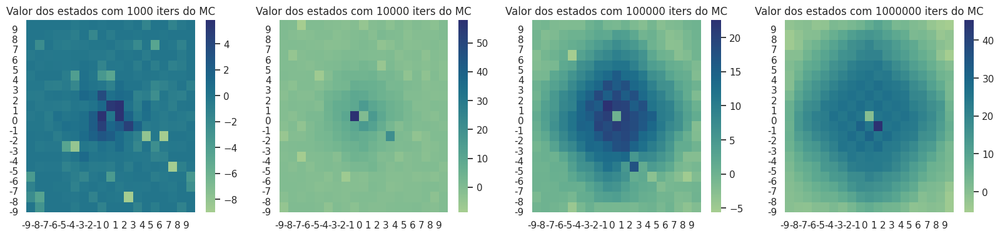

É possível observar que quanto mais o treinamento ocorre, melhor fica a aproximação para um valor ótimo, isto seria, onde os estados mais dintântes possuem valor mínimo e os estados mais centrais possuem valores maiores, considerante que o (0,0) é onde está a fruta, é onde deseja-se chegar.

Uma outra possível comparação a ser feita é saber quantos passos em média cada abordagem levaria para chegar na fruta. Os resultados montraram os seguintes valores (sendo a média de 1000 experimentos aleátórios) e comparados com a política aleatória e com uma regra ótima, criado por nós, que indica o melhor caminho possível sempre:

- Política aleatória: 239 passos em média
- Monte Carlo após 1 Milhão de iterações de treino: 70 passos em média
- Política ótima: 7 passos em média


Segundo nossos análises, o Monte Carlo atingiu o mesmo resultado na maioria dos experimentos, mas fica commédia maior por acabar caindo em loops e subindo a média, uma vez que consideramos a parada após 1000 passos sem chegar na fruta. As taxas de loops (ou episódios maiores que 1000) pode ser visto a seguir:

- Política aleatória: 3,7% de loops
- Monte Carlo após 1 Milhão de iterações de treino: 6,3% de loops
- Política ótima: sem loops


A fim de evitar Loops, fizemos um teste removendo a técnica $ϵ$-greedy na avaliação, e no lugar dela, adicionamos uma probabilidade de 1% de não seguir a política indicada pela função valor, mas sim escolher uma ação aleatória, evitando ficar preso em loops dessa forma.

O resultado foi uma redução para 0.1% de loops apenas e uma redução para 20.3 como tamanho médio do episódio. Mostrando assim que o método de Monte Carlo funcionou e perfoma de maneira bastante eficiente e conseguiu aprender a jogar no ambiente proposto.

### Avaliando o hiperparâmetro N0

A próxima análise a ser realizada se baseia no pararâmetro N0. Podemos ver a seguir um gráfico (em escala logarítimica no eixo x) da quantidade de loops ou episódios com mais de 1000 passos que ocorreram fixando o número de passos de treinamento do Monte Carlo como 10000 e função reward de -1 a cada passo do agente e 99 no caso de pegar a fruta/comida, ou seja, chegar no final do episódio, avaliando assim o efeito da variação do N0 entre 1, 10, 100, 1000, 1000. Já o segundo o gráfico segue a mesma configuranção mas mostra o número médio de passos até se chegar a fruta nas diferentes configurações.




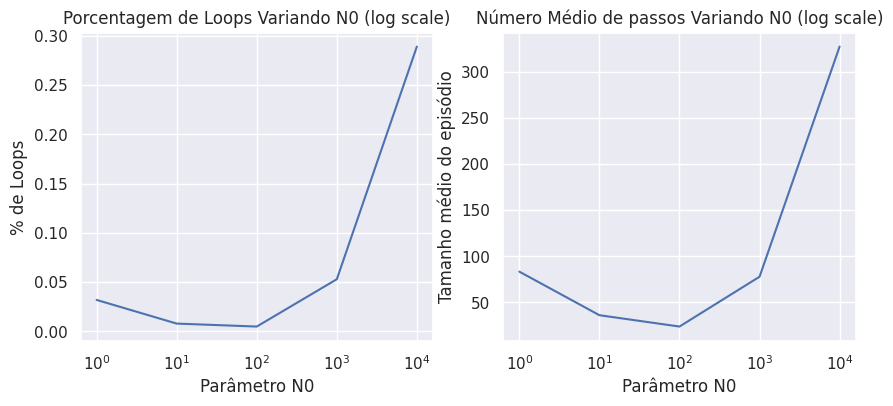

Para o nosso ambiente e nossas configurações coletadas, o que se mostrou mais eficaz foi o N0=100. Isso depende diretamente do problema sendo tratado, uma vez que o tamnho do npumero de estados pode influenciar muito nessa conta.

### Avaliando o ambiente estocástico

Para a avaliar o processo de aprendizado do agente em um ambiente estocático, foram realizados os seguintes exprimentos, fixando o N0=1000 do método ϵ-greedy e alterando o número de iterações de treino:

Para a avaliar a dificuldade no treino, de forma mais ampla, adiciona uma probabilidade de ação escolhida pelo a gente não se concretizar. De forma lúdica, pode ser visto como um "escorregão" ou um vento no agente durante a execução do episódio. Neste primeiro teste, qaulque lugar do tabuleiro pode ocorrer esses eventos aleatórios, abaixo estão mostrados os resultados para a probablidade de ocorrencia de 10%, 50% e 90% desses eventos aleatórios.

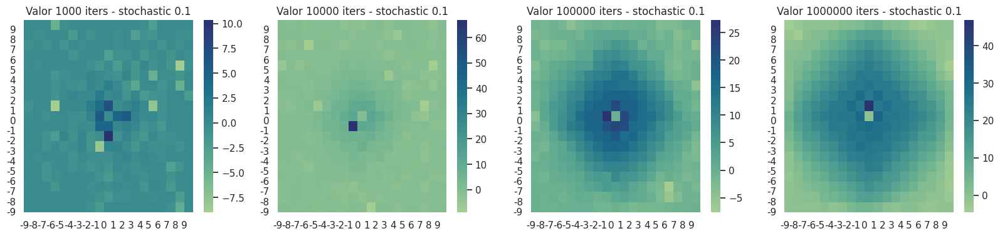

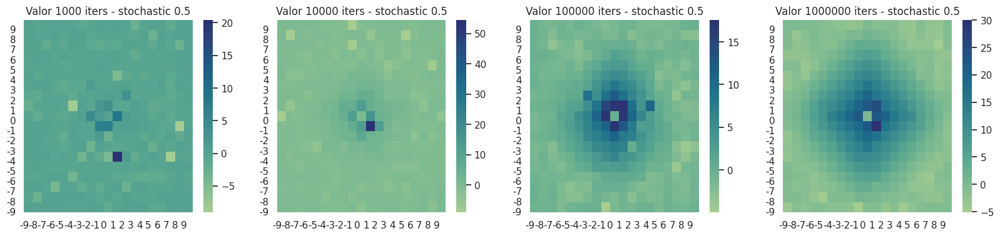

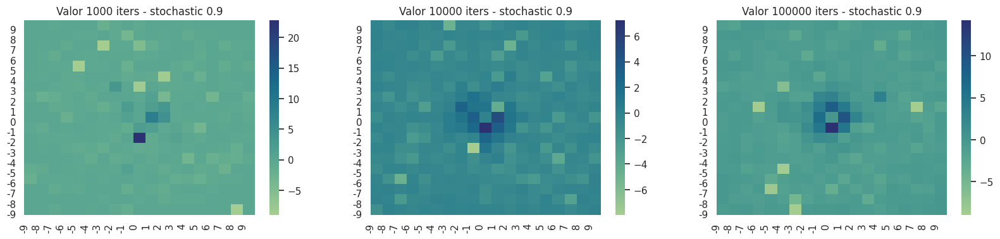

É possível notar, através da análise da uniformidade das cores dos estados representando o valor, nesses casos, a maior dificuldade de aprendizado do agente para ambientes mais estocáticos. Isso se deve por conta da dificuldade de atribuir o valor correto do estado no episódio, demandando mais iterações de treino para efetivamente conseguiur valorá-los.

A diferença nos maios numeros de iterações é evidente, uma vez que no ambiente menos estacástico a função valor ficou mais gradual e menos ruidosa, o agente aprendeu de forma muito mais lenta no caso de um ambiente mais estocástico.

### Avaliando a influencia do reward

Para avaliar a influencia da função reward, mostramos os gráficos abaixo. Nesse caso, usamos o N0=100 para o ϵ-grredy e um alpha dinâmico com requerido e todos foram rodados com 10mil iterações.

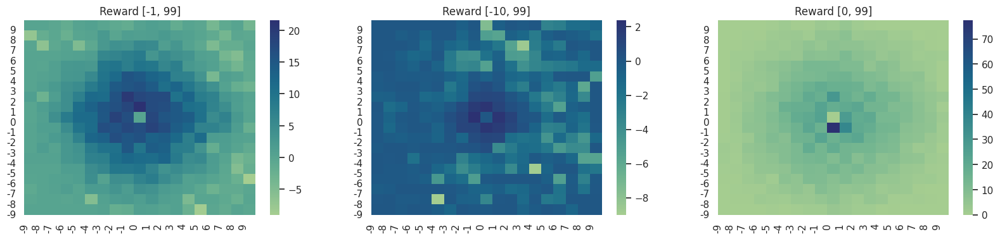

1) O primeiro deles mostra a função utilizada nos testes anteriores, que desconta um ponto a cada passo e adiciona 99 pontos ao conseguir o objetivo. Essa modelagem foi feita para que o agente evite desperdiçar passos, e por isso é punido enquanto anda, e que tente chegar o mais proximo da comida, e por isso é recompensado quando chega. Nesse caso, o tamnho médio do epsódio é 85 e a proporção de loops é de 6,8%

2) O segundo gráfico, mostra um aprendizado mal sucedido, por conta de uma penalização muito alta no andar do agente. Esse desbalanço evidencia a importanâcia do balanço desse reward, uma vez que a recopença no objetivo deve ser suficiente para valorar bem os estados. Nesse caso, o tamnho médio do epsódio é 800 e a proporção de loops é de 79%.

3) O terceiro gráfico mostra o oposto. Nesse caso, não há desconto ao andar, porém há o desconto temporal pelo fator γ da atualização, fazendo com que os estados ainda sejam de certa forma valorados e ainda haja aprendizado. Ou seja, recompensando menos os maiores episódios.  Nesse caso, o tamnho médio do epsódio é 20 e a proporção de loops é de 0,1%


Fica evidente então que um balanço entre a recompensa final e o desconto ao andar, ainda que seja somente pelo fator gamma, torna o aprendizado do agente mais efetivo.

Pórem, encontramos uma modelagem melhor para função reward, que faz com que o a gente aprenda de forma eficiente.

### Avaliando o Melhor que Encontramos

Utilizando todos os testes e informações anteriores, chegamos na melhores características para esse problema:

- O máximo de iterações possíveis, o resutado mostrado é para 100mil.
- N0 sendo 100.
- Função reward apenas com 99 de recompensa no final.


Treinamos um agente com as melhores características, os resultadas de: grafico da função valor, numero médio de passos no epsódio e proporção de loops e episódios maiores que 1000 podem ser vistos abaixo (para rodar, basta descomentar as células abaixo, demora ~1-2min).

- Tamanho médio de 8 à 20 passos por episódio, dependendo da simulação
- Proporção de loops inferior à 0.1%

A seguinte função valor:


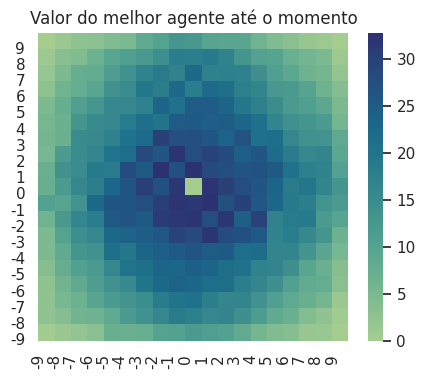

## Analises Aproximador Linear

A fim de analisar a última forma requerida de Reiforcement Learning, criamos um aproximador linear de função, que tem seus pesos otimizados no treinamento através do gradiente descendente, a cada episodio realizado. Os resultados foram interessantes e mostram o poder desse tipo de aproximação na solução do problema.

Sendo um problema bastante simples tratado aqui, o aproximador linear função de maneira satrisfatória, porém em ambientes mais complexos talvez fosse nessário função mais complexas e o uso de redes neurais profundas para calcular a aproximação do valor dos estados.

### Monte Carlo

Os primeiros testes foram realizados no monte carlo e geraram resultados surpreendentes. No nosso cenário consideramos 3 pesos: Um para distância no eixo x, um para distância em y e um de bias da regressão linear.

Como recomendado em aula, também criamos features dos nossos estados, o que auxiliou bastante na convergência do modelo linear, que não alcança resultados satisfatórios sem tais features. Essas features são simplesmente o módulo (valor absoluto) de cada entrada do estado e foi tão efetiva pois acaba representando melhor a distância até o objetivo.

Como resultado, apenas 10 epsódios rodados já sufiente para gerar uma boa aproximação dos pesos para estimação do valor dos estados. Porém entendemos que isso se deve a baixa complexidade do cenário, além do fato de ele já ser discretizado, que torna a função muito fácil de ser ajustada.

Como resultado, obtemos uma média de passos por epsódio de ~7.8, e nenhuma loop acanteceu durante os testes, que é resultado muito bom pelo que vinhamos testando anteriormente. E pode ser visto no código a seguir.

O learning rate utilizado é de 0.00001 e o reward é de -1 por passo e 99 no objetivo.

In [ ]:
#criando o jogo e o agente monte carlo
game = SnakeGame()
game.render()
agent = MonteCarloAgent(game)

for i in range(10): #rodando epsódios para teinar os pesos da regressao linear
  agent.run_episode(method = 'random', render = False)

test_method(method = 'linear_aproximator', n_iter = 10000) #testando com o valor estimado pela regressao

(7.7275, 0.0)

# Testes do Método Q Learning


## Códigos e Funções

Abaixo estão listados os códigos que usamos para rodar esses experimentos. Isso pode demorar um pouco e por isso estão comentados, apenas um código com poucos episódios para caso queira avaliar a classe rodando. Os resultados serão exibidos na próxima seção.

In [17]:
#def plot_steps(step_per_episodes, stochastic,epis_size,ep_len_mean, stochastic_percentage=0):
#    Calculate the mean of the stepses
#   mean_step = np.mean(step_per_episodes)

    # Plot the mean steps as a horizontal line

#   plt.figure(figsize=(10, 6))
#   plt.plot(step_per_episodes, label='Steps per Episode')
#   plt.title(f'Steps per Episode: { f"Partialy Stochastic {stochastic_percentage}" if stochastic == 1 else "Non-Stochastic"}')
#   plt.xlabel('Episode Number')
#   plt.ylabel('Steps')
#   plt.axhline(y=ep_len_mean, color='r', linestyle='--', label=f'Mean Steps Best: {ep_len_mean:.2f}')
#   plt.legend()
#   plt.grid(True)
#   plt.show()
   # plt.savefig(f'Q_learning/Graphs2/state_action_best_q_learning_{epis_size}_{stochastic}_{stochastic_percentage}_runs.png')

In [18]:
#def plot_steps_reward(step_per_episodes, epis_size, reward_shape,ep_len_mean):
#  # Calculate the mean of the stepses
#   mean_step = np.mean(step_per_episodes)

    # Plot the mean steps as a horizontal line

#   plt.figure(figsize=(10, 6))
#   plt.plot(step_per_episodes, label='Steps per Episode')
#   plt.title(f'Steps per Episode - Incentivo: {reward_shape[1]} - Punição: {reward_shape[0]}')
#   plt.xlabel('Episode Number')
#   plt.ylabel('Steps')
#   plt.axhline(y=ep_len_mean, color='r', linestyle='--', label=f'Mean Steps Best: {ep_len_mean:.2f}')
#   plt.legend()
#   plt.grid(True)
#   plt.show()

In [19]:
def test_q_policy(agent, n_iter = 1000, sarsa = False, sarsa_lambda = False):
 ep_len_total = 0
 loop = 0
 for i in range(n_iter):

   ep_len = agent.run_episode(sarsa = sarsa, sarsa_lambda = sarsa_lambda )
   ep_len_total +=  ep_len

   if ep_len>=999:
     loop+=1

 ep_len_mean = ep_len_total/n_iter
 prop_loop = loop/n_iter

 return ep_len_mean, prop_loop

In [20]:
#def run_q_tests(epis_size, stochastic, test_game, percentage=0):
# q_learning = QLearning(test_game, stochastic=stochastic, stochastic_percentage=percentage)
# print(f"Treinamento em ambiente: { 'Partialy' if q_learning.stochastic == 1 else 'non-stochastic'}")
# q_learning.train(epis_size, sarsa = False)
# ep_len_mean, prop_loop = test_q_policy(q_learning, n_iter=33)
# test_game.render()
# print(f"ep_len_mean: {ep_len_mean}")
# plot_steps(q_learning.step_per_episode, stochastic,epis_size,ep_len_mean, percentage)
#  with open(f'/data/loop_steps/state_action_best_q_learning_{epis_size}_{stochastic}_{percentage}_loop_interations.pkl', 'wb') as fp:
#    pickle.dump(test_q_policy(q_learning), fp)
#  with open(f'Q_learning/steps_state_actions/state_action_best_q_learning_{epis_size}_{stochastic}_{percentage}_runs.pkl', 'wb') as fp:
#    pickle.dump(q_learning.q_table, fp)

  # plot_state_action_heatmap(q_learning.q_table, stochastic) # Nao to conseguindo fazer funcionar para estado/acao (Gibosky)

In [ ]:
#test_game = SnakeGame()
#episode_size = [100, 500, 1000, 5000]
#for stochastic in range(0,2):
# for episodes in episode_size:
#   print(f"stochastic: {stochastic} - Episodes: {episodes}")
#   if stochastic == 1:
#     for percentage in [0.2, 0.5, 0.9]:
#       run_q_tests(episodes, stochastic, test_game, percentage)
#   else:
#     run_q_tests(episodes, stochastic, test_game)

In [ ]:
#def run_q_tests_reward(epis_size, test_game, reward):
# q_learning = QLearning(test_game)
# q_learning.train(epis_size, sarsa = False)
# ep_len_mean, prop_loop = test_q_policy(q_learning)
# plot_steps_reward(q_learning.step_per_episode, epis_size, reward)
#  with open(f'Q_learning/reward_loop/state_action_best_q_learning_{epis_size}_reward_punicao{reward[0]}_incentivo_{reward[1]}_loops.pkl', 'wb') as fp:
#    pickle.dump(test_q_policy(q_learning), fp)
#  with open(f'Q_learning/reward_state_actions/state_action_best_q_learning_{epis_size}_reward_punicao{reward[0]}_incentivo_{reward[1]}_runs.pkl', 'wb') as fp:
#    pickle.dump(q_learning.q_table, fp)
  # plot_state_action_heatmap(q_learning.q_table, stochastic) # Nao to conseguindo fazer funcionar para estado/acao (Gibosky)

In [ ]:
#episode_size = [100, 500, 1000]
#reward_shape = [(-1, 99), (0, 99), (-10,99)]
#for reward in reward_shape:
# test_game = SnakeGame(reward_shape=reward)
# for episodes in episode_size:
#     run_q_tests_reward(episodes, test_game, reward)

In [ ]:
# Exemplo de treinamento e resultados do agente (de maneira simplificada)
game = SnakeGame()
agent = QLearning(game)
agent.train(100, sarsa = False)

print("Steps per episode", agent.step_per_episode)
print("Min Steps", min(agent.step_per_episode))
print("Max Steps", max(agent.step_per_episode))
print("AVG Steps", sum(agent.step_per_episode)/len(agent.step_per_episode))

decision array per episode [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

## Resultados



<video width="480" height="320" controls>
  <source src="./data/all_q_learning.mp4" type="video/mp4">
</video>

### Avaliando o número de iterações de treino

É possível observar que quanto maior a quantidade de episódios durante o treinamento, melhor fica a proximação para um valor ótimo, isto seria, de modo que o algoritmo costuma convergir após 100 episódios e a quantidade média de passos vai diminuindo conforme o treinamento.

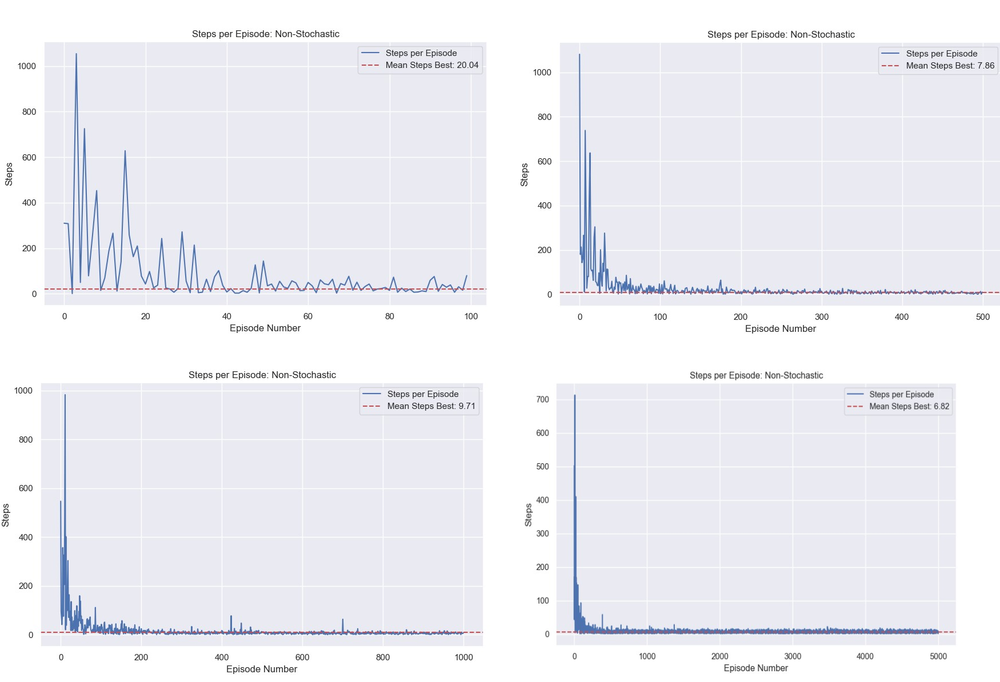

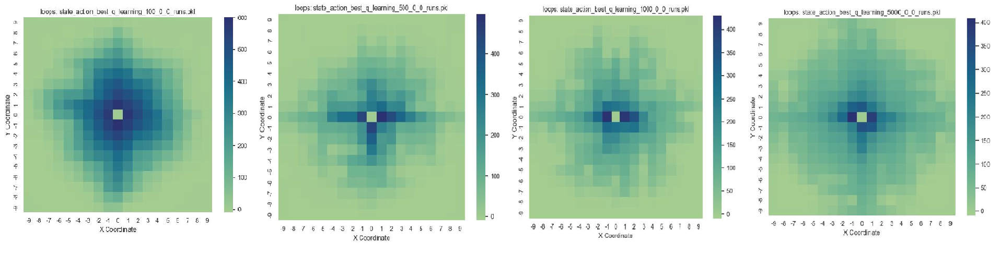

### Avaliando o ambiente estocástico

Para a avaliar a dificuldade no treino, de forma mais ampla, adiciona uma probabilidade de ação escolhida pelo a gente não se concretizar. De forma lúdica, pode ser visto como um "escorregão" ou um vento no agente durante a execução do episódio. Neste primeiro teste, é criado um quadrante em que pode ocorrer esses eventos aleatórios e ao entrar nessa zona, ocorre uma ação aleatória. Abaixo estão mostrados os resultados para a probablidade de ocorrencia da zona aleatória no *grid* de 20%, 50% e 90%.

#### 20%

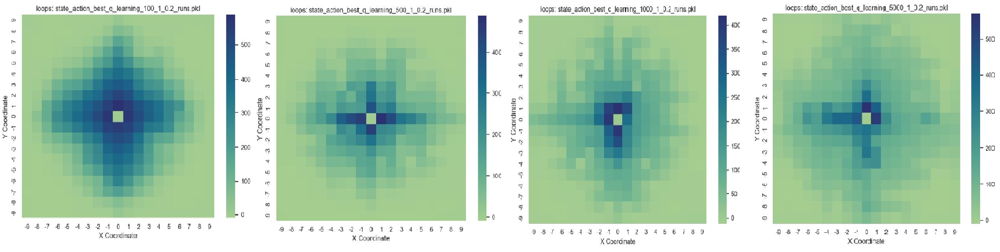

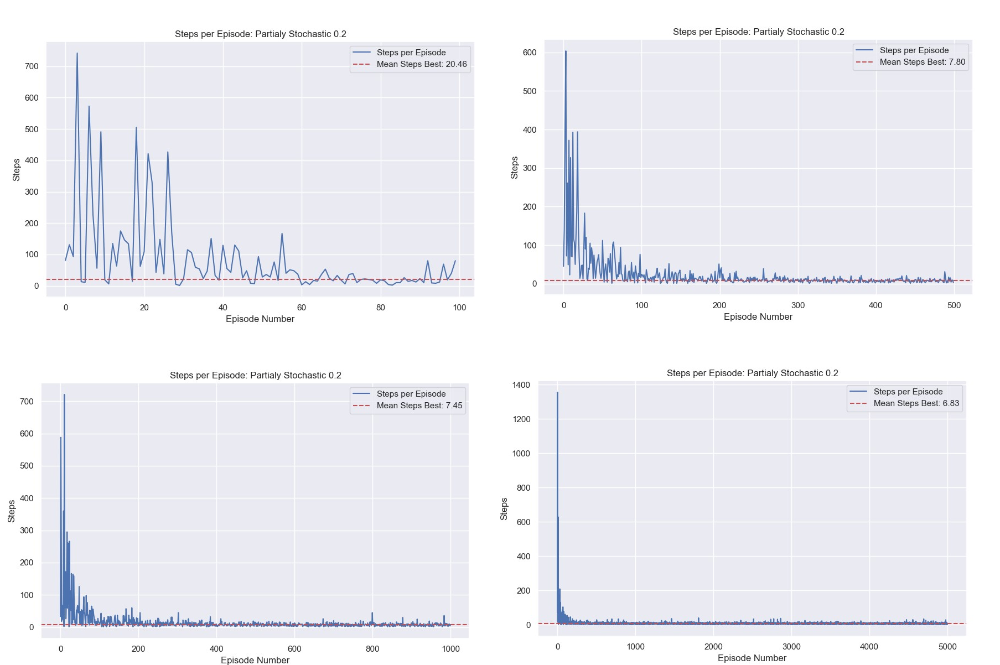

#### 50%

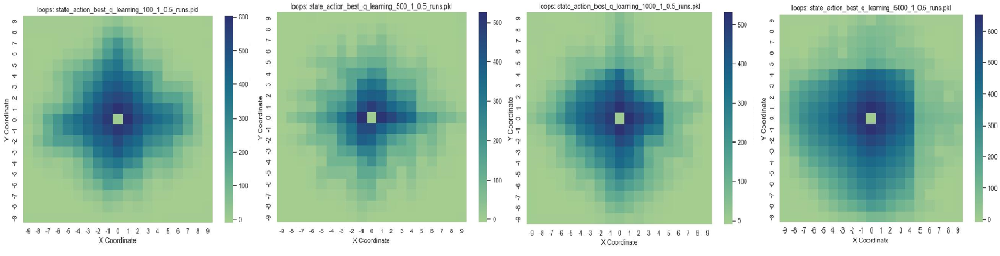

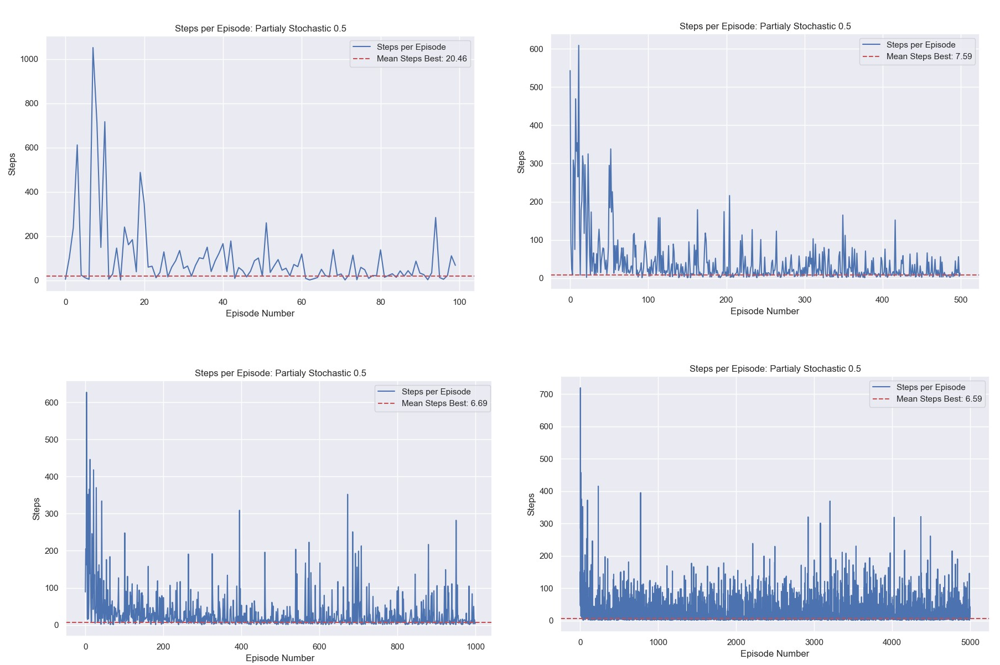

#### 90%

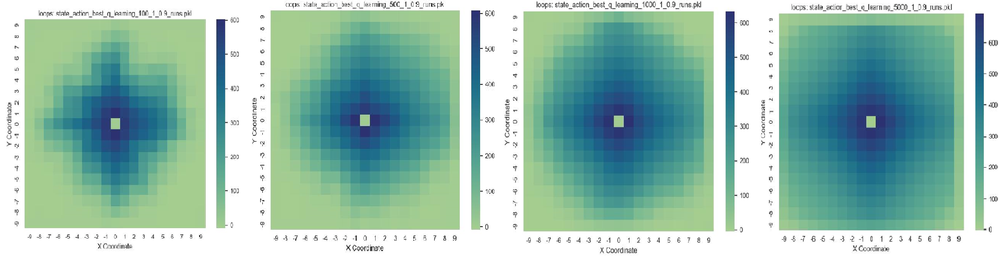

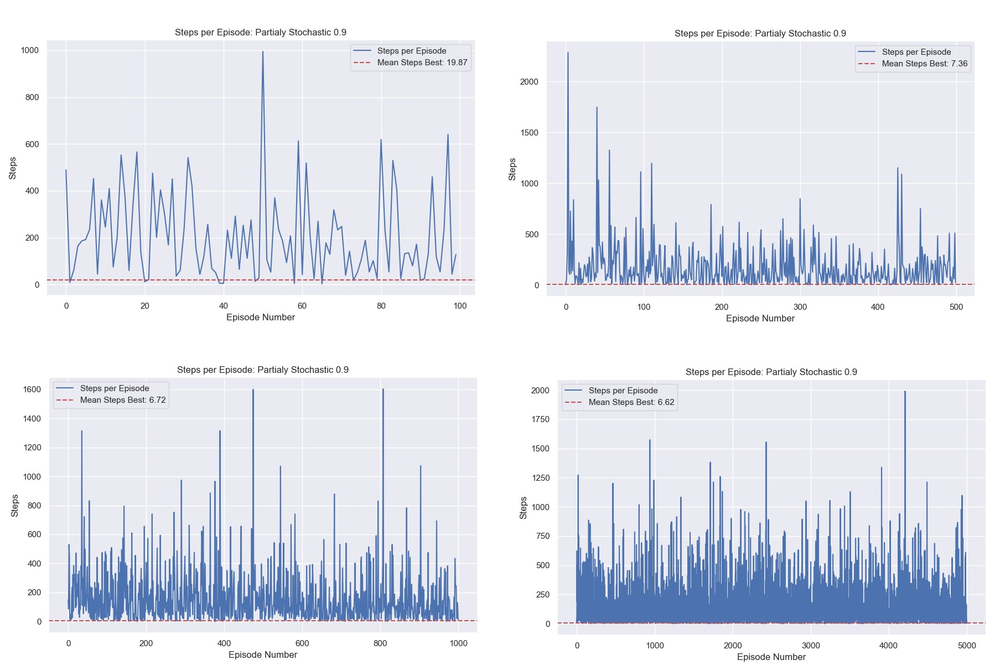

É possível notar, através do gráficos da quantidades de passos, a maior dificuldade de aprendizado do agente para ambientes mais estocáticos. Isso se deve por conta da dificuldade de atribuir o valor correto do estado no episódio, demandando mais iterações de treino para efetivamente conseguiur valorá-los.

A diferença nos maios numeros de iterações é evidente, uma vez que no ambiente menos estacástico a função valor ficou mais gradual e menos ruidosa, o agente aprendeu de forma muito mais lenta no caso de um ambiente mais estocástico ou mesmo não converge.

### Avaliando a influencia do reward

Para avaliar a influencia da função reward, mostramos os gráficos abaixo. Nesse caso, rodados entre 100 e 1000 iterações.

1) O primeiro gráfico mostra o oposto. Nesse caso, não há desconto ao andar, porém há o desconto temporal pelo fator γ da atualização, fazendo com que os estados ainda sejam de certa forma valorados e ainda haja aprendizado. Ou seja, recompensando menos os maiores episódios. Os dados estão abaixo:

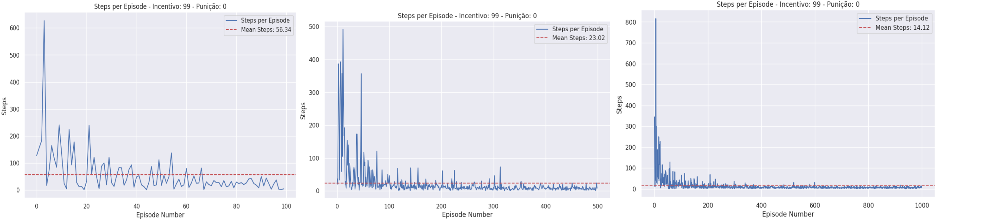


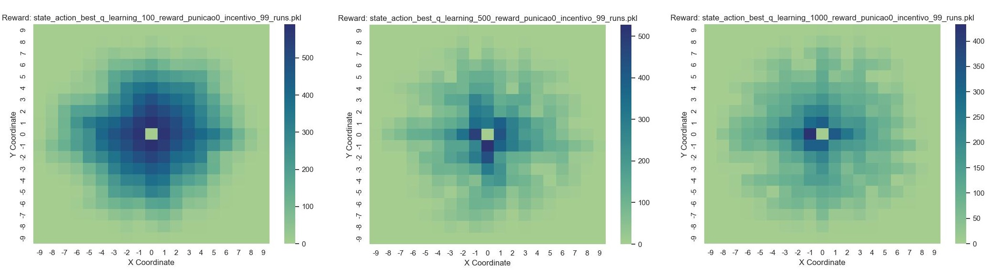

2) O segundo deles mostra a função utilizada nos testes anteriores, que desconta um ponto a cada passo e adiciona 99 pontos ao conseguir o objetivo. Essa modelagem foi feita para que o agente evite desperdiçar passos, e por isso é punido enquanto anda, e que tente chegar o mais proximo da comida, e por isso é recompensado quando chega.

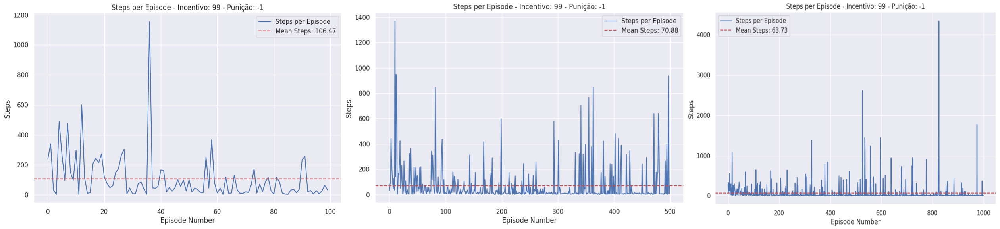



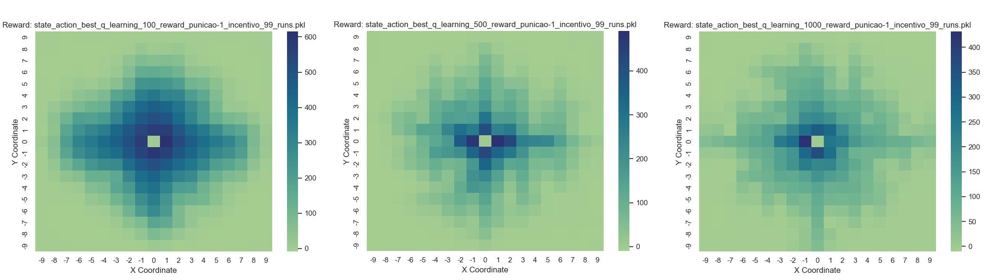

3) O terceiro gráfico, mostra um aprendizado mal sucedido, por conta de uma penalização muito alta no andar do agente. Esse desbalanço evidencia a importanâcia do balanço desse reward, uma vez que a recopença no objetivo deve ser suficiente para valorar bem os estados.

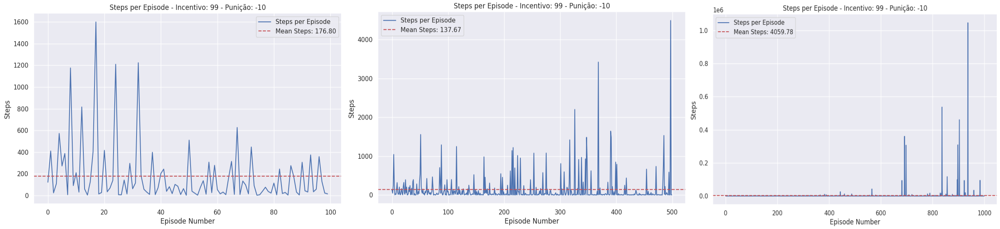


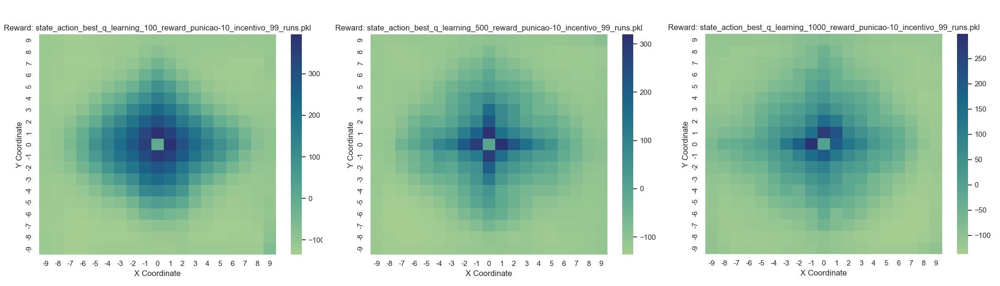

Fica evidente então que um balanço entre a recompensa final e o desconto ao andar, ainda que seja somente pelo fator gamma, torna o aprendizado do agente mais efetivo.

Pórem, encontramos uma modelagem melhor para função reward, que faz com que o a gente aprenda de forma eficiente.

### Avaliando o Melhor que Encontramos

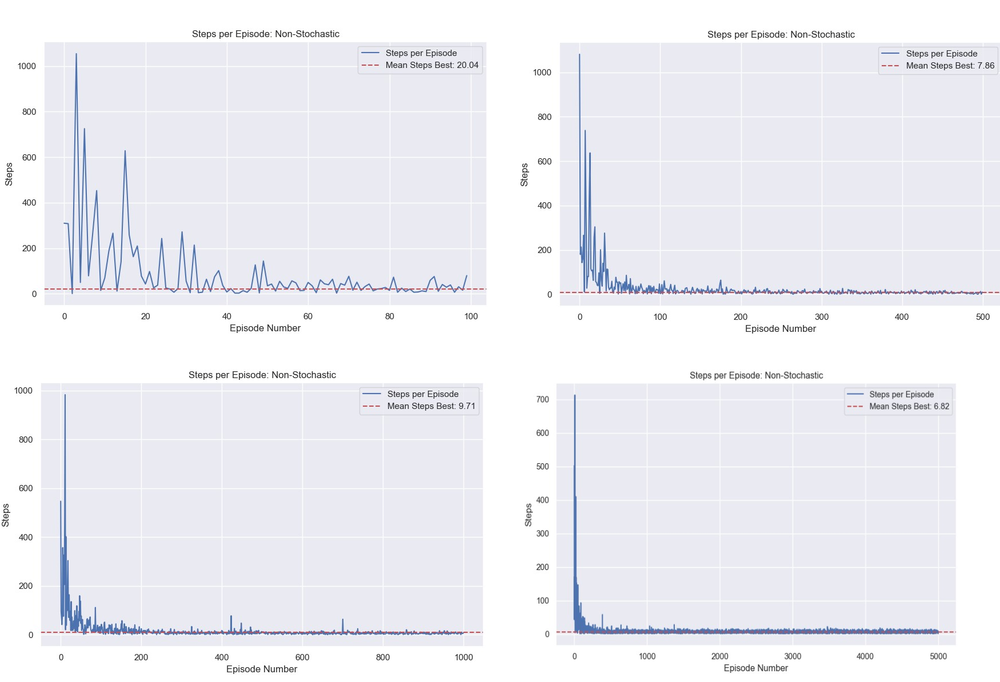

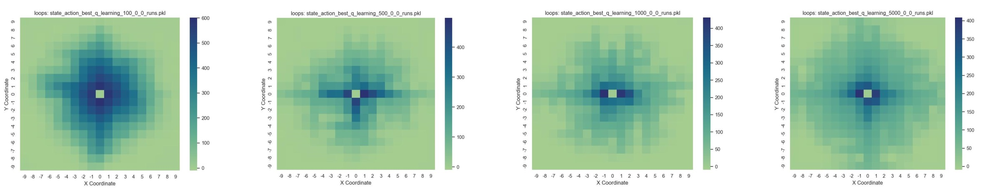

# Testes do Método Sarsa(λ)

## Códigos e funções

Os mesmos códigos já utilizados nas análises do Q-Learning também foram utilizados no Sarsa, apenas com algumas modificações para diferenciar a classe do agente. Abaixo tem um código descomentado para mostrar o agente em ação:

In [ ]:
# Exemplo do agente sarsa(0):

# Exemplo de treinamento e resultados do agente (de maneira simplificada)
game = SnakeGame()
agent = Sarsa(game)
agent.train(100, sarsa = True)

print("Steps per episode", agent.step_per_episode)
print("Min Steps", min(agent.step_per_episode))
print("Max Steps", max(agent.step_per_episode))
print("AVG Steps", sum(agent.step_per_episode)/len(agent.step_per_episode))

Steps per episode [94, 124, 212, 34, 238, 318, 66, 97, 280, 417, 233, 107, 236, 245, 157, 134, 18, 477, 197, 452, 64, 208, 289, 6, 121, 581, 27, 20, 8, 93, 63, 31, 374, 496, 617, 75, 120, 50, 383, 330, 60, 13, 185, 611, 26, 17, 173, 12, 130, 1079, 595, 73, 8, 9, 8, 164, 639, 50, 119, 26, 34, 15, 353, 10, 277, 324, 294, 460, 754, 13, 243, 31, 709, 25, 533, 8, 542, 64, 136, 100, 78, 10, 20, 48, 142, 11, 14, 12, 24, 21, 125, 5, 17, 20, 2, 762, 2055, 297, 10, 141]
Min Steps 2
Max Steps 2055
AVG Steps 208.28


In [ ]:
# Exemplo do agente sarsa(λ), com λ fixo em 0.9:

# Exemplo de treinamento e resultados do agente (de maneira simplificada)
game = SnakeGame()
agent = Sarsa_lambda(game)
agent.train_sarsa_lambda(10)

print("Steps per episode", agent.step_per_episode)
print("Min Steps", min(agent.step_per_episode))
print("Max Steps", max(agent.step_per_episode))
print("AVG Steps", sum(agent.step_per_episode)/len(agent.step_per_episode))

Steps per episode [403, 241, 315, 154, 168, 76, 459, 124, 147, 21]
Min Steps 21
Max Steps 459
AVG Steps 210.8


In [ ]:
#sarsa_max_value3 = {}
#dists = [-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9]
#actions = [(1, 0), (-1, 0), (0, 1), (0, -1)]
#with open(f'teste_stochastic_0.9_sarsa_lambda__05_300runs.pkl', 'rb') as fp:
#    value_function = pickle.load(fp)
#for x in dists:
#  for y in dists:
#    m = -np.inf
#    for a in actions:
#      try:
#        if value_function[((x, y), a)]>m:
#          m = value_function[((x, y), a)]
#          sarsa_max_value3[(x, y)] = m
#      except KeyError:
#        #print(((x, y), a))#sao as bordas
#        pass

In [ ]:
#fig, axs = plt.subplots(1, 3, figsize=(15, 4))

#j=0
#k=0
#for i in [1, 2, 3]:
  #if k==3:
  #  j = j+1
  #  k=0

#  if i==1:
#    leg = 1000
#    l = 0.5
#    stoc = 0.2
#    value_function = sarsa_max_value1
#  elif i==2:
#    leg = 1000
#    l = 0.5
#    stoc = 0.5
#    value_function = sarsa_max_value2
#  else:
#    leg = 300
#    l = 0.5
#    stoc = 0.9
#    value_function = sarsa_max_value3

  #value_function = sarsa_max_value{i}
  #value_function = agent.value_function
#  matrix_values = np.zeros((19, 19))
#  for m in list(value_function.keys()):
#    m = str(m)
#    x = int(m.split(',')[0].split('(')[1])
#    y = int(m.split(',')[1].split(')')[0])

#    matrix_values[x+9][y+9] = value_function[(x, y)]

#  matrix_values[9][9] = 0

  #print(j, k)
#  sns.heatmap(matrix_values, ax = axs[j], cmap="crest")#, ax = axs[i], annot = True)
#  axs[j].invert_yaxis()
#  axs[j].set_xticks(range(19))
#  axs[j].set_xticklabels([-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9])
#  axs[j].set_yticks(range(19))
#  axs[j].set_yticklabels([-9,-8,-7,-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6,7,8,9])
#  axs[j].set_title(f'Valor para {leg} eps com λ=0.5 e estocasticidade {stoc}')
#  #k=k+1
#  j=j+1

In [ ]:
# print("decision array per episode", q_learning.decision_explore_exploit)
#print("Steps per episode", agent_sarsa_lambda.step_per_episode)
#print("Min Steps", min(agent_sarsa_lambda.step_per_episode))
#print("Max Steps", max(agent_sarsa_lambda.step_per_episode))
#print("AVG Steps", sum(agent_sarsa_lambda.step_per_episode)/len(agent_sarsa_lambda.step_per_episode))
#sarsa_q_df = pd.DataFrame.from_dict([agent_sarsa_lambda.q_table])
#sarsa_e_df = pd.DataFrame.from_dict([agent_sarsa_lambda.e_table])
#print(sarsa_q_df)
#print(sarsa_e_df)

## Sarsa(0)

Antes de criar o algoritmo utilizando o parâmetro λ, construímos uma versão mais simples, o SARSA(0), onde damos apenas um passo para frente para computar e atualizar o valor de Q. O motivo foi para avaliar a convergência do algoritmo mais simples e depois comparar quando adicionássemos o parâmetro (λ=0, por exemplo) e também por que a derivação das funções já criadas para o SARSA(0) seriam mais simples.

### Convergência (comparação de número de iterações)

O primeiro teste no algoritmo do SARSA foi para avaliar se ele estava convergindo para o nosso ambientes. Um ponto que percebemos conforte os treinos do SASRSA foram que conforme a quantidade de iterações aumentava, mais tempo demorava para o agente ser treinado. Esse ponto é imporante pensando em evolução do modelo e a relação entre custo e tempo, pensando em obter um agente eficaz.

Realizamos os testes de treinamos para 1000, 3000 e 10000 iterações em um ambiente não estocástico inicialmente e computamos o valor da tabela Q para todos os pares estado-ação explorados pelo agente durante o treinamento. Um ponto importante é que esse algoritmo não leva em consideração o parâmetro λ, então estamos dando apenas um passo para avaliar o próximo estado e ação (pode ser considerado um SARSA(0)). Outros pontos importantes para a análise dos resultados abaixo é do reward, que foi -1 a cada passo do agente e 99 no caso de pegar a fruta/comida e a mesma proposta usada em MC para evitar loopings.

Para conhecimento, o tempo de treinamento foi de apenas alguns segundos para 1000 iterações e evoluiu para aprox. 30 minutos para 10000 iterações.

Nas imagens abaixo podemos avaliar os valores observados pelo agente de cada estado e a média de passos de acordo com a quantidade de episódios no treino. Podemos avaliar que treinando o agente com 1000 episódios, ele se concentrou no centro do tabuleiro, em um comportamento de "linha reta" partindo do centro e teve uma média de 155 passos até encontrar a fruta. Já conforme aumentamos a quantidade de episódios, ele começou a se movimentar por todo o tabuleiro, melhorando assim o conhecimento do agente sobre o mundo e a direção necessária para ir até a fruta, já a quantidade de passos médios por episódio até chegar a fruta foi otimizado, que caiu para 55 passos em média com 3000 episódios de treino e 27 passos em média para 10000 episódios de treinamento.

Além disso, na imagem 2 é possível ver que temos um episódio outlier, com aproximadamente 25k passos até encontrar a fruta. Isso mostra que com poucos episódios de treinamento, o agente do SARSA(0) ainda não conseguiu aprender a política completamente. Esse comportamento de looping já não é visto com tanta frequência conforme a quantidade de episódios do treino aumenta.

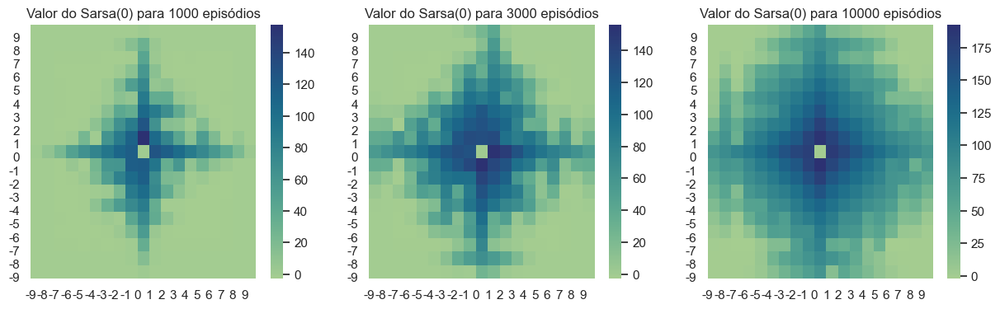

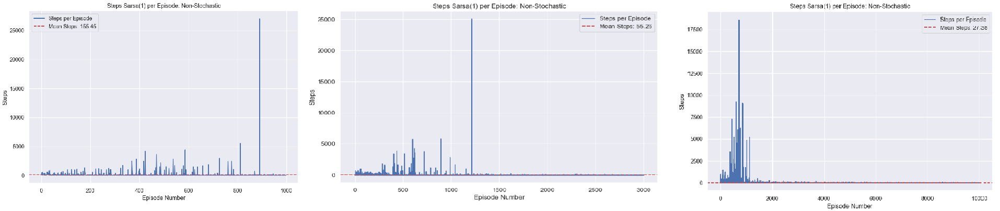

### Comparação entre diferentes rewards

Outro ponto para comparação foi avaliar a convergência do agente para diferentes rewards. Como na análise de convergência usamos um reward de -1 a cada passo em direção a fruta e 99 ao alcançá-la, testamos outras duas combinações:
1. Reward de 99 ao alcançar a fruta e -10 a cada passo;
2. Reward de 99 ao alcançar a fruta, sem reward negativo por passo.

A primeira combinação de reward não foi muito satisfatória para o SARSA(0), pois o agente entrou em um looping infinito e não foi possível rodar nenhum treino com mais de 500 episódios, pois a função dava erro de time out. Já a segunda combinação foi bem positiva para o SARSA(0), com convergências mais rápidas (alcançando uma média de passos menor mais rápido que a combinação explorada na análise de convergência).

Analisando mais afundo cada um dos resultados, nas duas imagens abaixo temos o valor do agente para a 1º combinação de reward e a quantidade média de passos por episódio durante o treinamento. É possível ver que o agente entrou em looping no centro do tabuleiro, não explorando quase nada, com uma média de passos altíssima. A média de passos com certeza é influenciada pela pouca quantidade de episódios no treinamento, mas a não possibilidade de aumentar os episódios por conta de looping e time-out do agente, reforça que essa combinação de reward não foi satisfatória.

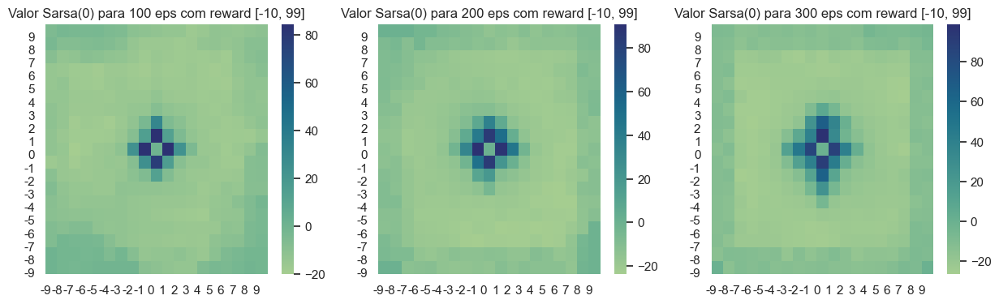

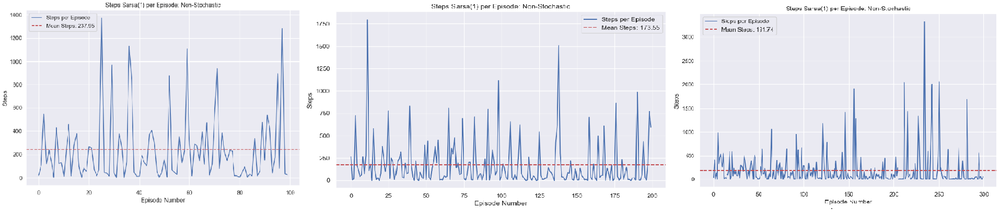

Agora avaliando a segunda combinação de reward, ela foi bem positiva para o SARSA(0), igual a combinação de reward [-1, 99] utilizado na comparação da convergência (primeiro tópico). Abaixo podemos avaliar o valor do agente e a média de passos por episódios para os treinamentos com 1000, 3000 e 10000 episódios cada. 

Avaliando os valores do agente, o mesmo comportamento pode ser visto em relação ao primeiro reward testado ([-1, 99]): com poucos episódios o agente se manteve no centro do tabuleiro, mas ao treinar com 10000 episódios, ele já conseguiu aprender a se movimentar por todo o tabuleiro. A grande diferença entre esses dois rewards são a média de passos por episódio, que apenas com 1000 episódios, o agente teve uma média de 18 passos, enquanto no reward [-1, 99] anterior esse valor foi maior que 100. Esse fato se deu principalmente pela ausencia de loopings utilizando o reward [0, 99]. O melhor resultado foi treinando o agente com 10000 episódios, onde obtivemos uma média de passos menor que 10. No reward anterior [-1, 99] esse valor foi de 27, ou seja, apenas retirando o reward negativo a cada passo conseguimos reduzir em aproximadamente 17 passos na média por episódio. 

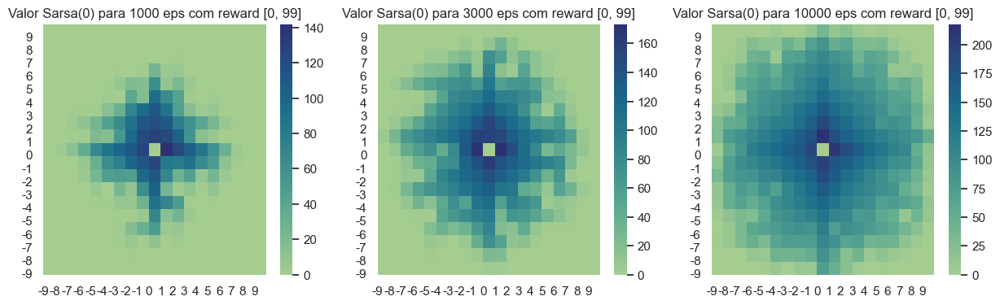

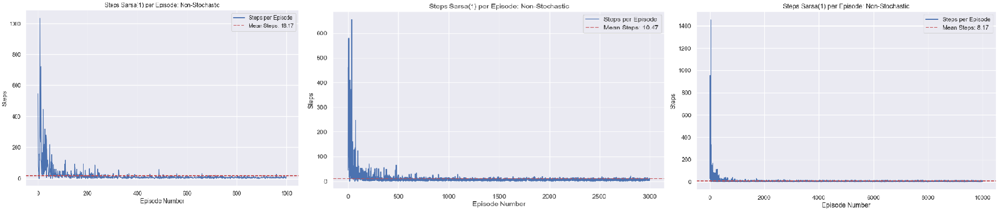

### Estocasticidade

Para avaliar como o SARSA(0) se comportaria em ambientes estocásticos, comparamos o treinamento com 5000 e 10000 episódios considerando três níveis de estocasticidade: um ambiente 20%, 50% e 90% estocástico. O objetivo é comparar a média de passos e a função valor dos agentes nos ambientes com os resultados já obtidos nos testes anteriores.

Na primeira análise, podemos avaliar o treinamento do agente utilizando 5000 episódios para cada um dos três ambientes estocásticos propostos. O SARSA(0) pareceu não sofrer tanto com os dois primeiros ambientes, já que é possível perceber que a partir de 2000 episódios o agente já não entrou mais em looping e obteve uma média de passos razoável, mesmo sendo maior do que as encontradas nos testes sem estocasticidade no ambiente. Já para o ambiente 90% aleatório em todos os episódios o agente entrou em loop (mais de 1000 passos no episódio) e andou no tabuleiro de maneira aleatória, sem nenhuma política de movimento. 

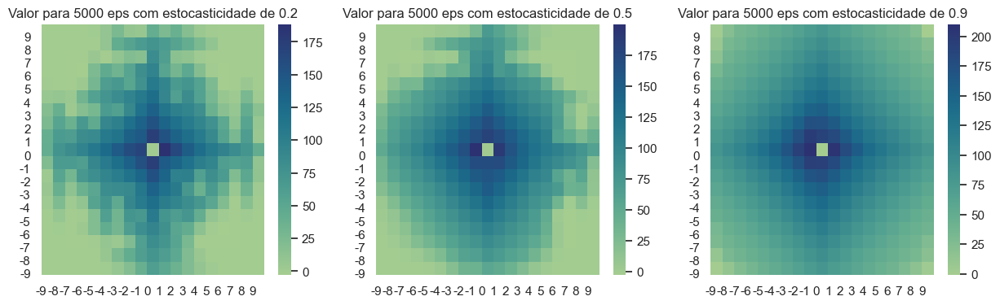

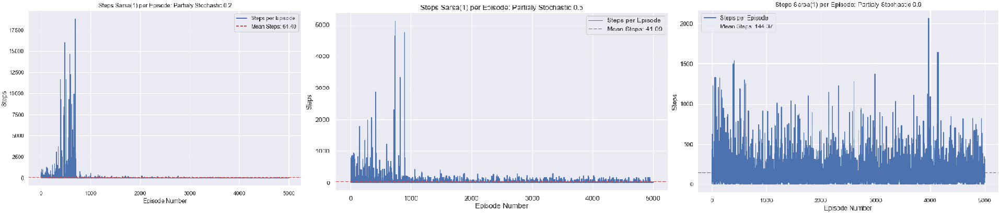

O mesmo comportamento pode ser visto treinando o agente com 10000 episódios. Nos dois primeiros ambientes o agente parou de entrar em looping após os primeiros ~2000 episódios com uma matriz de valores bem parecida com as encontradas nos testes anteriores. E para o ambiente com 90% de estocasticidade, pela matriz de valores o agente até aprendeu a percorrer todo o tabuleiro, porém não foi capaz de aprender a menor direção até a fruta, fazendo uma média de quase 150 passos por episódio, entrando em looping em muitos deles.

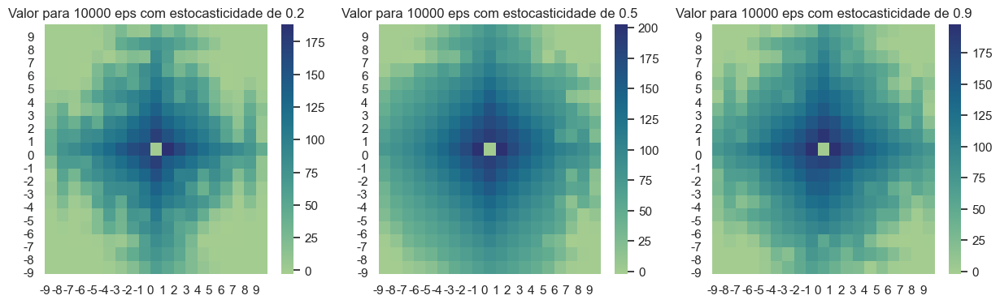

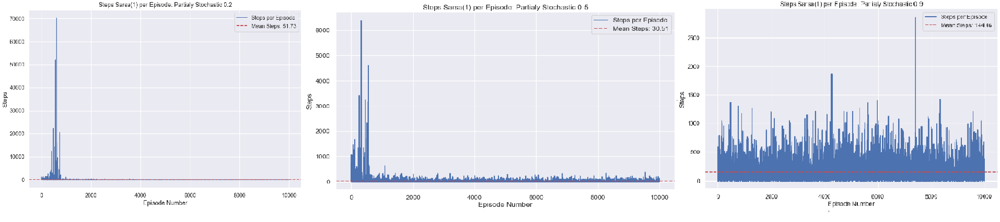

### Conclusão: SARSA(0)

O desempenho geral do SARSA(0) foi bom, com resultados bastante similares ao encontrado para MC. A melhor combinação de recompensas foi a [0, 99], ou seja, apenas mantendo a recompensa final de 99 e sem nenhuma recompensa negativa por passo dado. Nesse caso, a média de passos do SARSA(0) foi de aproximadamente 9. Em relação aos ambientes estocásticos, o SARSA(0) pareceu começar a precisar de mais episódios de treino em um ambiente quase completamente estocástico (90%). Em ambientes com 20% e 50% de aleatoriedade, também é possível concluir que seria necessário mais episódios para alcançar os mesmos passos médios do ambiente não estocástico (comparação entre os testes de 10000 eps), porém estes tiveram uma média de passos ainda razoável em relação ao ambiente 90% estocástico.

## Sarsa(λ)

Para a avaliação do SARSA(λ), a mesma classe criada para o SARSA(0) foi utilizada, porém agora adicionando a tabela E (que esse algoritmo também armazena, além da tabela Q) e levando em consideração correr por todos os pares de valores de estado-ação a cada passo do agente. Por mais que nosso ambiente tenha até poucas combinações comparado com definições de mundo mais complexas (temos 100 estados e 4 ações, totalizando 400 valores possíveis), esse algoritmo se mostrou muito mais pesado que o SARSA(0) ou o MC. Não só pelo fato de precisar de mais poder de memória para armazenar as duas tabelas E e Q, mas sim por ter que varrer todos os 400 valores dos pares estado-ação a cada passo e isso mostrou ser o maior ofensor da performance do algoritmo.

Os mesmos testes que antes foram avaliados, porém em alguns casos em uma menor quantidade de episódios (se comparar com os testes feitos no SARSA(0)): a convergência do algoritmo, a influência do reward, diferentes ambientes estocásticos e por último a performance do algoritmo para diferentes valores de λ.

### Convergência (número de iterações)

Como no teste do SARSA(0) descobrimos uma melhor convergência para os valores de reward [0, 99], utilizamos essa combinação para iniciar os testes do SARSA(λ). Além disso, também fixamos um λ=0.5 (nem muito TD, nem muito MC) para avaliar a convergência de acordo com o aumento de episódios no treino e também nos outros testes que não precisavam de alteração no reward ou no valor do λ.

Avaliando a convergência do algoritmo é possível ver que para o treinamento com apenas 100 episódios, o agente mal se locomoveu pelo tabuleiro e teve uma média de passos de quase 150 por episódio, um valor bem alto. Já aumentando a quantidade de episódios no treinamento paa 500 e 1000, respectivamente, o agente já demonstrou aprender melhor a andar pelo tabuleiro mas seguir mais rápido em direção a fruta, já que a média de passos para os dois casos foi de aprox. 16 e 35, um range que está se aproximando do melhor resultado obtido até agora com o SARSA(0) também com poucos episódios. Um outro ponto que é possível perceber com os gráficos é que para o treinamento com 1000 episódios, em que o agente começou a andar mais pelo tabuleiro, houveram mais loopings do que os outros dois testes e que pode ser uma possível consequência de que 1000 episódios não seja um número ainda satisfatório de treinamento considerando o parâmetro λ.

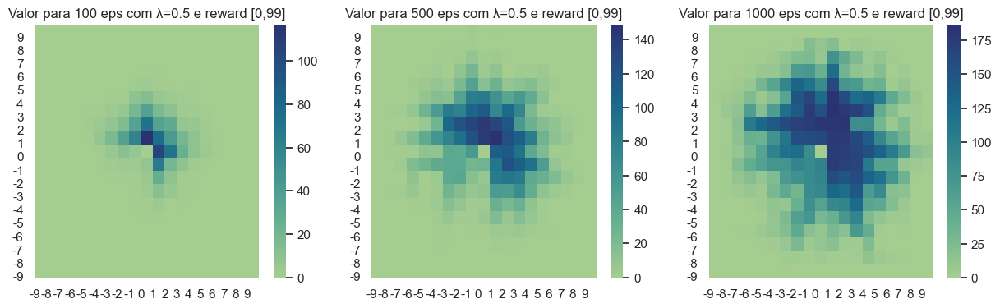

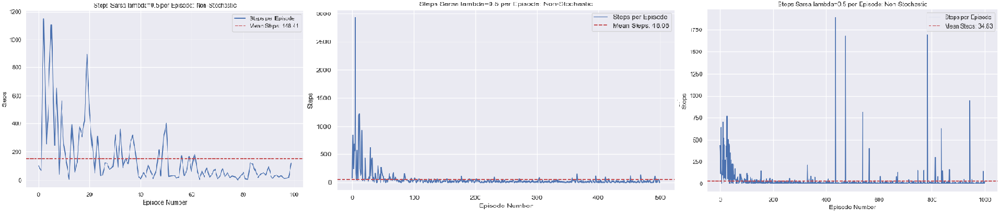

### Diferente valores de λ

Uma avaliação importante é em relação aos diferentes valores de λ e como o agente se comporta em um treinamento com uma quantidade fixa de episódios. Para este teste, todos os agentes foram treinados com 1000 episódios cada, utilizando o reward [0, 99] e variando os valores de λ de 0 a 1, com espaçamento de 0.1.

A primeira interpretação que podemos tirar das imagens abaixo é que para 1000 episódios, quanto menor o valor de λ, menor o agente explorou o tabuleiro e ficou mais concentrado no cento. Já para valores maiores de λ, é possível ver pela função valor de Q que o agente se espalhou mais e explorou um espaço maior do tabuleiro. Já para a quantidade média de passos, é possível afirmar que na média todos os testes ficaram razoavelmente próximos, salvo em alguns casos onde houveram uma quantidade mais alta de episódis em looping. Os destaques são para os valores centrais de λ: 0.4, 0.5 e 0.6, onde mostraram o melhor trade-off entre a exploração do mundo e a média de passos até alcançar a fruta.

Um ponto importante para auxiliar a interpretação dos resultados é que talvez para o algoritmo apenas 1000 episódios seja um valor baixo, mas devido ao tempo de execução e ao notebook dando time-out depois de um tempo, foi o maior valor que conseguimos alcançar.

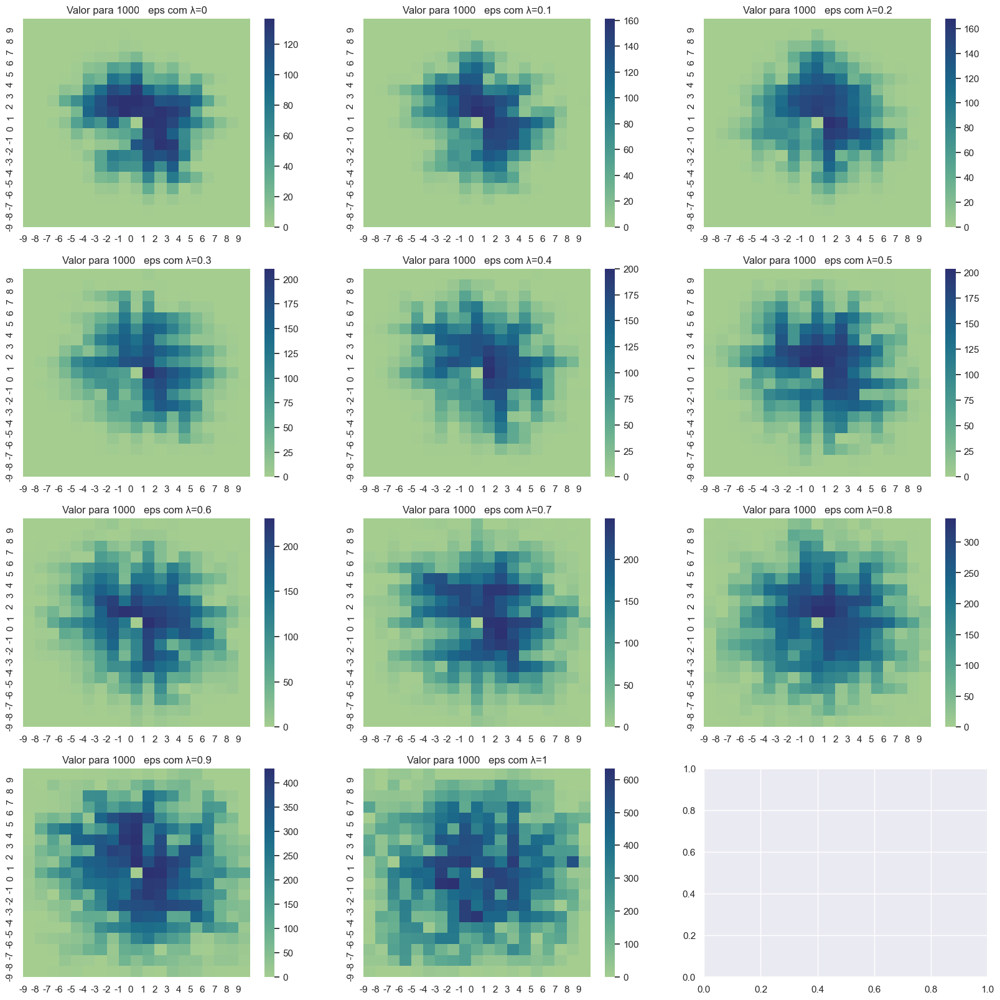

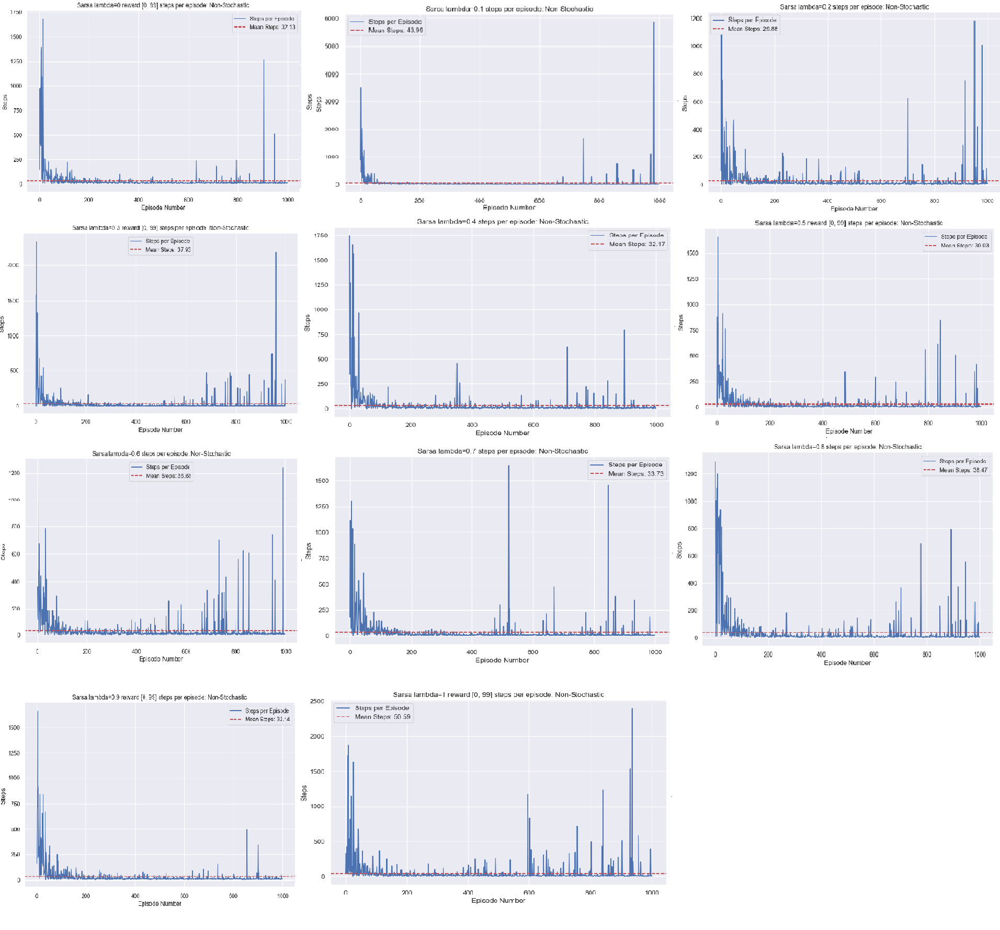

No gráfico abaixo é apenas para visualizar melhor o resultado da quantidade média de passos para cada valor de λ. Os menores estão realmente para os valores de λ centrais. 

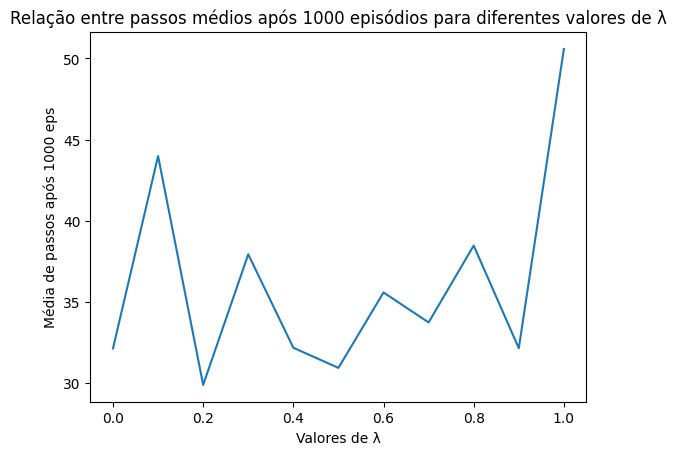

### Diferentes rewards

Para testar as três propostas de reward, fixamos o valor de λ em 0.9. Os três tipos de rewards testados foram:
1. Recompensa de 99 ao alcançar a fruta e punição e -1 a cada passo;
2. Recompensa de 99 ao alcançar a fruta e punição de -10 a cada passo;
3. Recompensa de 99 ao alcançar a fruta, sem punição por passo.

O primeiro ponto a se destacar, que até não tem efeito direto em relação ao reward, mas sim com um maior valor de λ foi o tempo de treinamento. Treinando o agente com apenas 300 episódios foi um dos valores máximos alcançados sem precisar ficar rodando várias vezes a função para evitar time-out pelo Google Colab. 

Avaliando os resultados dos rewards, logo de primeira já é possível ver que a combinação 2 não foi nem um pouco satisfatória para o Sarsa(λ), com o agente em looping na borda do tabuleiro e com uma média de passos por episódio de mais de 1000. Ou seja, em quase todos os episódios o agente entrou em looping. Já a combinação 1 teve uma média de passos inferior à combinação 2, porém ainda bem longe da conversão: uma média de quase 500 passos por episódio. Nesse caso, o looping do agente foi no centro do tabuleiro, e não nas bordas como antes. Já na combinação 3, a média de passos foi de aprox. 60 por apisódio, com o agente mais concentrado no centro devido a baixa quantidade de episódios no treinamento mas sem indícios de looping conforme a quantidade de episódios vai aumentando.

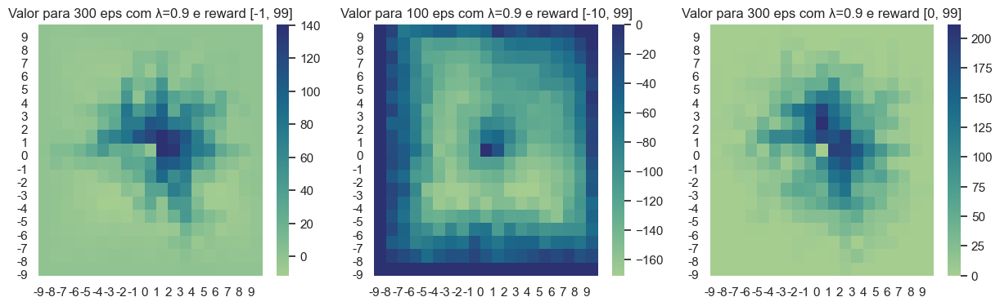

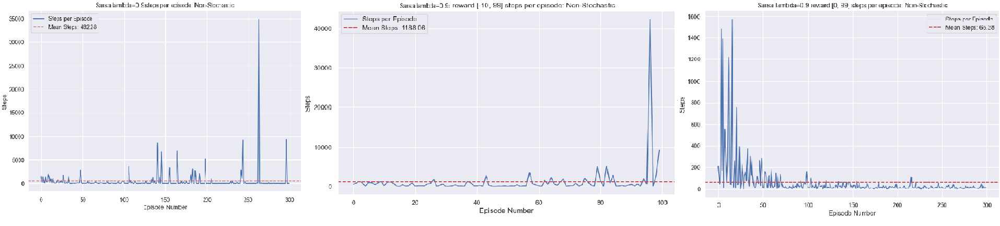

### Estocasticidade 

Para avaliar o desempenho do agente em ambientes estocásticos, também consideramos três níveis diferentes: 20%, 50% e 90% de aleatoriedade, para um λ=0.5 e reward [0, 99]. 

O sarsa(λ) teve uma média de passos um pouco mais alta do que os testes anteriores no ambiente 20% estocástico, mas sofreu bastante ao aumentar a aleatoriedade para 50% e 90%. Nesse último caso, nem conseguimos rodar mais do que 300 episódios de treinamento, pelo looping infinito que o agente entrava. Esses fatos podem ser comprovados nas imagens abaixo, onde o agente teve uma média de quase 600 passos para a estocasticidade 90%. Nesses casos, para considerar um ambiente estocástico no problema, a quantidade de poder computacional deveria ser aumentada drásticamente, para que fosse possível rodar um treinamento com altos valores de episódios para avaliar a convergencia (ou não) do agente.

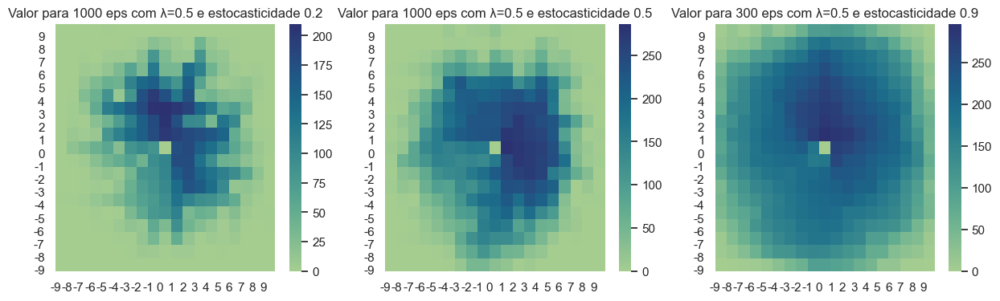

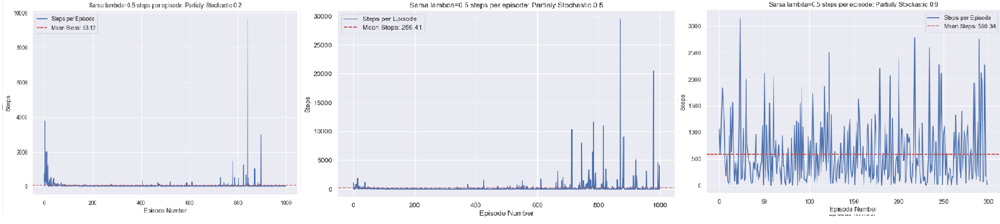

### Conclusões: Sarsa(λ)

A primeira conclusão do algoritmo é a de que quanto maior o valor de λ, maior parece ser o tempo de treinamento necessário para a converencia do agente, além de um treinamento com mais episódios. Já para os rewards, igual no Sarsa(0) o melhor desempenho foi a combinação [0, 99], onde não há punição para cada passo dado. Já em relação ao ambiente estocástico, o Sarsa(λ=0.5) já mostrou dificuldades para o valor 50%, piorando drásticamente em 90%. E em relação à média de passos nos diferentes valores de , os mais promissores foram os valores mais centrais, como 0.4, 0.5 e 0.6.

Além disso, o tempo de processamento aumentou exponencialmente quando comparamos o sarsa(0) com o sarsa(λ). Não conseguimos rodar treinamentos com mais de 1000 episódios no sarsa(λ), e muitas vezes antes desse valor já tomávamos time-out do ambiente em que o notebook estava executando. Dessa forma, o sarsa(λ) se mostra um algoritmo também eficiente, porém apenas em casos onde exista o poder computacional necessário. Caso não, outras abordagens mais simples como o sarsa(0) se tornam mais interessantes.

# Testes do Método DQN

## Códigos e funções

In [44]:
# Exemplo do agente sendo treinado utilizando DQN:

agent = DQNAgent()
batch_size = 32  # Define an appropriate batch size
game = SnakeGame()
total_episodes = 10
max_steps_per_episode = 10

for episode in range(total_episodes):
    print(f"Current Episode: {episode}")
    state = game.get_state()  # Get initial state
    total_reward = 0

    for _ in range(max_steps_per_episode):
        action_index = agent.act(state)
        # action = ACTIONS[action_index]
        # print(action)
        #print(f"Current Step: {t}")
        reward, next_state, done = game.step_dqn(action_index)
        agent.train(state, action_index, reward, next_state, done)

        state = next_state
        total_reward += reward

        if done:
          print(done)
          break


Current Episode: 0
Current Episode: 1
Current Episode: 2
Current Episode: 3


Current Episode: 4
Current Episode: 5
Current Episode: 6
True
Current Episode: 7
True
Current Episode: 8
True
Current Episode: 9


In [50]:
def test_agent(agent, game, episodes):
  ep_lens = []
  max_steps = 10
  for episode in range(episodes):
      state = game.reset_dqn()
      print(f"Current state: {state}")
      total_reward = 0
      done = False
      ep_len = 0
      while not done and ep_len < max_steps:
          action_index = agent.test_act(state)
          reward, next_state, done = game.step_dqn(action_index)
          game.render()
          print(f"State: {state} - Reward: {reward}, next_state: {next_state}")
          state = next_state
          # print(f"Reward: {reward}")
          total_reward += reward
          ep_len += 1

          if done:
              print(f"Episode: {episode+1}, Total Reward: {total_reward}")
              ep_lens.append(ep_len)
              break
  return ep_lens


In [52]:
test_episodes = 20
game_test = SnakeGame()
game_test.render()
# ep_lens = test_agent(agent, game_test, test_episodes)
# # test_agent(agent, game, test_episodes)
# print(np.mean(ep_lens))

In [47]:
print(f"LOSS: {agent.loss}")

LOSS: [0.42096179723739624, 0.3442056477069855, 0.49572116136550903, 0.07374934107065201, 0.0990634635090828, 0.6754788756370544, 0.10269563645124435, 0.5604739785194397, 0.4133668541908264, 0.5408735871315002, 0.44663211703300476, 0.12232784181833267, 0.4767707586288452, 0.14773131906986237, 0.05926191806793213, 0.5815941095352173, 0.03571154177188873, 0.0002448144368827343, 0.05492709204554558, 0.12308833003044128, 0.03811091557145119, 0.027907177805900574, 0.1848609298467636, 0.0854668989777565, 0.14627605676651, 0.05736852437257767, 0.13733498752117157, 0.009582472033798695, 0.011245875619351864, 0.035007745027542114, 0.012581292539834976, 0.03486199304461479, 0.02979668602347374, 0.03267334774136543, 0.023285064846277237, 0.052791763097047806, 0.0090083172544837, 0.00957520492374897, 0.005793889984488487, 0.0275172907859087, 0.041267506778240204, 0.018299637362360954, 0.0009665875695645809, 0.002990349428728223, 0.0017286664806306362, 0.014846242032945156, 0.00048781419172883034, 

In [ ]:
#sns.lineplot(agent.loss)

In [ ]:
# Calculate the mean of the stepses
#mean_step = np.mean(ep_lens)

# Plot the mean steps as a horizontal line

#plt.figure(figsize=(10, 6))
#plt.plot(ep_lens, label='Steps per Episode')
#plt.title('Steps per Episode')
#plt.xlabel('Episode Number')
#plt.ylabel('Steps')
#plt.axhline(y=mean_step, color='r', linestyle='--', label=f'Mean Steps: {mean_step:.2f}')
#plt.legend()
#plt.grid(True)
#plt.show()


In [ ]:
# Save Trained Agent - So dont need to train again for test
# batch_size = 32  # Define an appropriate batch size
# total_episodes = 10
# max_steps_per_episode = 10
# def save_model_with_weights(agent, batch_size,total_episodes,max_steps_per_episode):
#    agent.model.save(f"./data/DQN/{batch_size}_{total_episodes}_{max_steps_per_episode}/model_dqn_agent_{batch_size}_{total_episodes}_{max_steps_per_episode}")
#    agent.model.save_weights(f"./data/DQN/{batch_size}_{total_episodes}_{max_steps_per_episode}/weights_dqn_agent_{batch_size}_{total_episodes}_{max_steps_per_episode}")
#    with open(f"./data/DQN/{batch_size}_{total_episodes}_{max_steps_per_episode}/loss_dqn_agent_{batch_size}_{total_episodes}_{max_steps_per_episode}.pkl", "wb") as fp:
#      pickle.dump(agent.loss, fp)

In [ ]:
#save_model_with_weights(agent, batch_size,total_episodes,max_steps_per_episode)

In [ ]:
#def load_file_agent_with_weights():
#  loaded_agent = DQNAgent()
#  file_path = "./"
  # loaded_agent.model = tf.keras.models.load_model(f"{file_path}/model_dqn_agent_{}")
  # agent.model.load_weights(f"{file_path}/weights_dqn_agent_{}")


In [ ]:
# Calculate the mean of the stepses
#mean_step = np.mean(ep_lens)

# Plot the mean steps as a horizontal line

#plt.figure(figsize=(10, 6))
#plt.plot(ep_lens, label='Steps per Episode')
#plt.title('Steps per Episode')
#plt.xlabel('Episode Number')
#plt.ylabel('Steps')
#plt.axhline(y=mean_step, color='r', linestyle='--', label=f'Mean Steps: {mean_step:.2f}')
#plt.legend()
#plt.grid(True)
#plt.show()

## Resultados

Para a avaliar a eficácia de usar outro método de aproximador de funções, agora focamos em desenvolver um treinamento da "mente" do nosso agente baseado em redes neurais profundas.

A vantagem desse método sobre a aproximador linear é a capacidade de generalização das redes neurais (NN) e a capacidade de aprendizado de ambientes mais complexos. No nosso caso o ambiente é mais simples (porém com possibilidade de ser flexibilizado e sua complexidade aumentada), então a avaliação desse método se baseia em observar sua potencialidade e capacidade de aprender rapidamente a se comportar.

Para treino do nosso agente, usamos uma rede neural de 2 camadas escondidas, cada uma com 64 neurônios e ativação ReLu para criar a não-linearidade. Além disso temos um tamanho da entrada igual a 2 (que é o tamanho que define nosso estado, dado pelas distancias (x,y) da fruta) e saída igual a 4 (o número de ações possíveis) com ativação liner na saída (pois podemos ter qualquer valor real). A *loss* do erro quadrático médio foi calculada com o otimizador ADAM, que foi o mais utilizado e com melhores resultados na literatura, além de um passo de aprendizado do tamanho de 0.001. A cada passo do agente no ambiente a rede era treinado em uma única época.

Abaixo podemos ver a *loss* do agente treinanedo em apenas 10 epsódios.

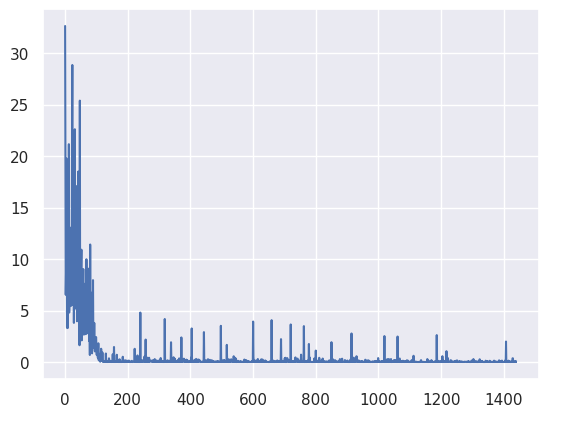

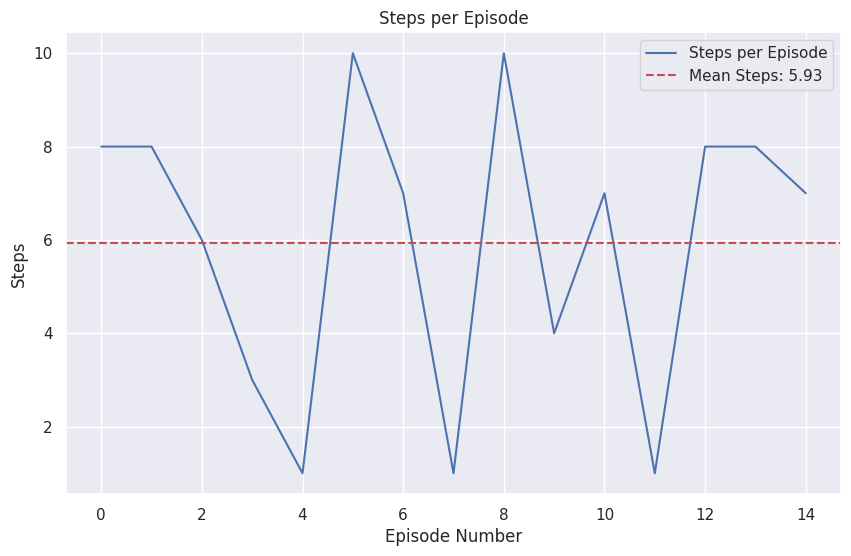

Treinado com 500 episódios e 10 steps

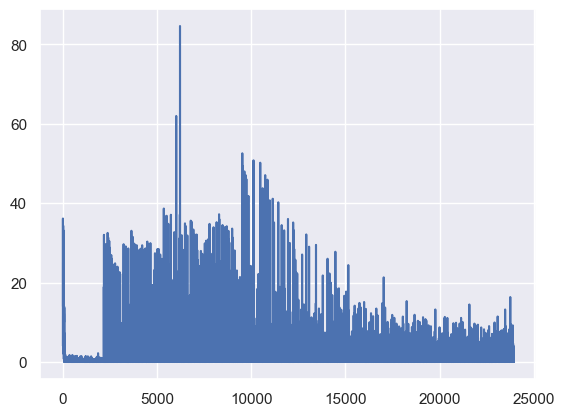

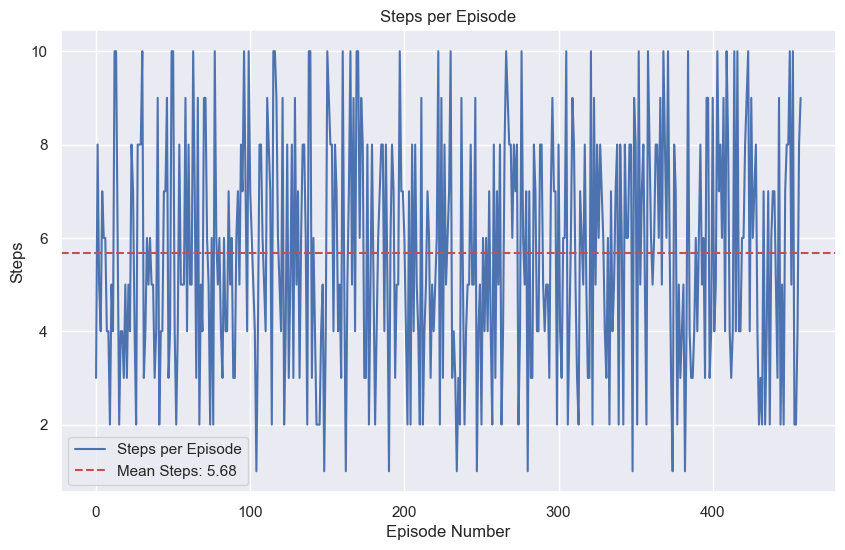

É possível ver que pós uma certa quantidade de episódios, o nosso agente treinado pelo DQN passa a ter um aumento expressivo da *loss*, com uma possível tendência de queda porém bem ruim do que treiando com poucos episódios. Além disso, a quantidade de passos fica com uma alta variabilidade, tendo episódios que ele alcança o objetivo em poucos passos mas outros que ele atinge a quantidade máxima de passos. Isso pode indicar que o agente funciona bem com poucos episódios de treinamento, ou que precisamos testar outras combinações da rede neural para que ele se torne mais efetivo.

# Avaliação e Discussão




## As vantagens e desvantagens do bootstrapping no seu problema.

Comparando o Monte Carlo com o Q_learning, é possível ver que ao fazer o boostrap por *step*, permitiu que o modelo convergise mais rápidamente, com menos steps. O grupo imagina que isso se dá pelo fato de que como o ambiente é mais simples, poucas inteações são o bastante para que a tabela de estado/ação assuma os valores otimos, sendo uma desvatagem para o MC, já que ele só atualiza os dados ao final do episódio.

Porém mesmo usando uma estratégia intermédiaria o Sarsa(λ) apresentou um tempo episódico grande nos testes, o que foi supresa para o grupo, apontando para um dificuldade do metodo no ambiente ou uma implementação que está limitada pelo ambiente computacional fornecido pelo Google Colab, em que mutias vezes treinamentos levaram horas e em alguns casos mesmo depois de muitas horas, o agente ainda não tinha convergido. Já o sarsa(0) por ser um algoritmo mais simples e rápido, se mostrou bastante eficiente também.



## Como a função de recompensa influenciou a qualidade da solução.

Como é possível ver nos testes, a mudança da recompensa afeta principalmente o comportamento e velocidade de aprendizado do agente, de modo que recompesas com amplitudes baixa entre "Punição" e "Incentivo", tendem a fazer o agente a ser mais cauteloso, enquanto a medida que cresce ele toma mais riscos. A pior combinação de recompensas foi com a punição -10, que fez com que os algorimos do Sarsa(λ) e Q-Learning (principalmente) sofressem bastante com os loopings infinitos, nem sendo possível treinar o agente com um número alto de episódios.

## O seu grupo foi capaz de alcançar a política esperada, dada a função de recompensa definida?

Todos os algoritmos tenderam para a mesma politica ótima que é ir na direção da comida, pegando o caminho com a menor distância. E conforme a quantidade de episódios de treino era aumentado, o agente aprendia a se locomover em mais espaços do tabuleiro, porém sempre traçando o menor caminho até a fruta.


## Como a aproximação da função influenciou os resultados. Quais foram as vantagens e desvantagens de usá-lo em nosso problema?

Aproximação da função ajudou a generalizar o cálculo do valor dos estados e devido ao ambiente ser fácilmente descrito, os pesos se ajustaram facilmente, já o problema é linear e estritamente crescente, o que facilita o aprendizado do modelo. Em apenas em 10 epsódios ele ja generalizou muito bem esse calculo, permitindo que com isso, seja possível aumentar o tamnho do tabuleiro e a função valor ainda seria ótima, pois generalizou.

A desvantagem é que ele acabou consumindo mais recursos computacionais, de modo que em testes com episódios maiores ocorream desconexão com o ambiente do Colab, sendo necessário fazer ajustes para que fosse possível realizar os teste e colher dados.

## Compare os resultados entre os ambientes: em qual foi mais difícil aprender?  Discuta os resultados.

Entre os métodos, Q-learning teve o melhore resultado, convergindo mais rápido. Seguido do Monte Carlo que também teve um desempenho semelhante. Assim o Sarsa(λ) apresentou a maior dificuldade de aprender a politica ótima, muitas vezes não convergindo nos testes feitos pelo grupo para valores de λ > 0. Mas se utilizássemos o Sarsa(0, λ=0) os resultados são comparáveis aos outros dois métodos.

Na tabela abaixo, podemos ver as configurações dos melhores agentes encontrados para cada uma das técnicas:

![Black and White Minimalist Fitness Center Table Comparison Chart Graph.png](<attachment:Black and White Minimalist Fitness Center Table Comparison Chart Graph.png>)
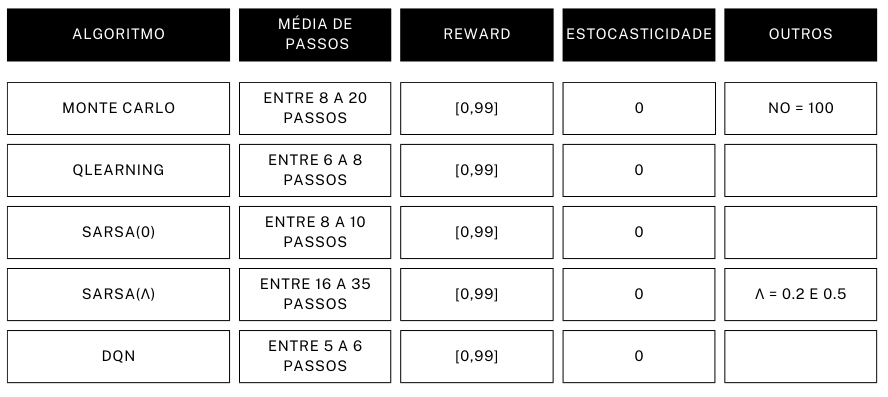

### Participação do Grupo

Todos os membros contribuiram em todas as implementações e na fase de preparação.

Gabriel focou no Monte Carlo, Guilherme no Q_learning e no DQN e Mariana no Sarsa.
Todos os membros contribuiram para as funções de plotar e coletar dados, assim como a parte deliberativa do relatório.